In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, classification_report, roc_curve
from sklearn.model_selection import learning_curve, cross_val_score, GridSearchCV
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import RobustScaler,StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("D:\\DATA SCIENCE\\Kaggle Projects\\11.AUSTRALIA RAINFALL PREDICTION\\weatherAUS.csv")

In [3]:
df.sample(n=10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
64302,2009-04-22,MelbourneAirport,8.1,24.0,0.0,4.0,10.3,NNW,37.0,N,...,48.0,29.0,1024.8,1021.4,0.0,1.0,16.3,22.9,No,No
87708,2010-04-23,Cairns,24.6,28.3,0.0,4.0,3.3,S,50.0,SE,...,81.0,73.0,1013.6,1010.7,7.0,7.0,25.8,27.0,No,Yes
117756,2009-05-08,PerthAirport,10.0,25.5,0.0,4.2,9.8,ENE,37.0,ENE,...,40.0,24.0,1029.0,1024.7,1.0,1.0,17.4,24.8,No,No
100757,2012-05-28,MountGambier,9.9,15.0,0.2,2.0,NaN,SSW,35.0,W,...,94.0,88.0,1032.3,1031.3,7.0,7.0,11.3,12.6,No,No
69444,2014-11-20,Melbourne,16.2,28.7,0.0,14.4,0.2,N,76.0,N,...,22.0,39.0,1006.7,1005.1,7.0,8.0,25.4,27.4,No,No
50292,2012-06-23,Tuggeranong,-2.3,11.0,0.0,NaN,NaN,WNW,33.0,NaN,...,100.0,48.0,1022.8,1022.2,NaN,NaN,1.3,10.4,No,No
132196,2015-03-14,Hobart,11.3,19.8,0.0,6.8,1.1,NNW,61.0,NNW,...,36.0,42.0,1007.2,1003.0,7.0,7.0,15.4,19.6,No,Yes
106990,2013-01-29,Woomera,14.1,26.7,0.0,15.4,13.1,SSW,54.0,SSE,...,49.0,26.0,1017.4,1015.5,0.0,0.0,16.7,23.8,No,No
16249,2012-03-18,Newcastle,17.0,23.4,1.0,NaN,NaN,NaN,NaN,SE,...,75.0,67.0,NaN,NaN,7.0,6.0,20.2,23.0,No,NaN
116105,2013-04-24,PearceRAAF,9.6,29.5,0.0,NaN,4.7,SSW,31.0,E,...,56.0,25.0,1021.4,1016.8,7.0,7.0,19.4,28.6,No,No


In [4]:
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

(145460, 23)

In [5]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [6]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [4]:
total_nulls=df.isnull().sum().sort_values(ascending = False)
percentage_nulls=(df.isnull().sum()*100/df.isnull().count())
percentage_nulls= percentage_nulls.sort_values(ascending = False)
missing_values = pd.concat([total_nulls, percentage_nulls], axis = 1, keys = ['Total Nulls', 'Percentage of Missing Values'])    
missing_values['Data Type'] = df[missing_values.index].dtypes
missing_values

,Total Nulls,Percentage of Missing Values,Data Type
Sunshine,69835,48.009762,float64
Evaporation,62790,43.166506,float64
Cloud3pm,59358,40.807095,float64
Cloud9am,55888,38.421559,float64
Pressure9am,15065,10.356799,float64
Pressure3pm,15028,10.331363,float64
WindDir9am,10566,7.263853,object
WindGustDir,10326,7.098859,object
WindGustSpeed,10263,7.055548,float64
Humidity3pm,4507,3.098446,float64


In [4]:
df=df.drop(["Sunshine","Evaporation"],axis=1)

In [6]:
df.Cloud3pm.mean()

4.509930082924903

In [7]:
df.Cloud3pm.median()

5.0

<function matplotlib.pyplot.show(close=None, block=None)>

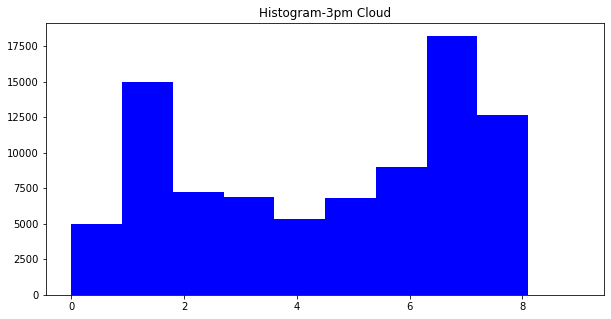

In [100]:
##Histogram
plt.hist(df.Cloud3pm,color='blue')
plt.xlabel=("3pm Cloud")
plt.title('Histogram-3pm Cloud')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [5]:
df["Cloud3pm"]=df.Cloud3pm.fillna(df.Cloud3pm.mean())

In [9]:
df.Cloud9am.mean()

4.4474612602152455

In [10]:
df.Cloud9am.median()

5.0

<function matplotlib.pyplot.show(close=None, block=None)>

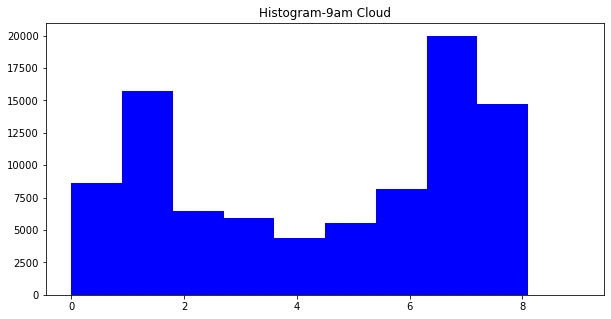

In [105]:
##Histogram
plt.hist(df.Cloud9am,color='blue')
plt.xlabel=("9am Cloud")
plt.title('Histogram-9am Cloud')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [6]:
df["Cloud9am"]=df.Cloud9am.fillna(df.Cloud9am.mean())

In [12]:
df.Pressure9am.mean()

1017.6499397983179

In [13]:
df.Pressure9am.median()

1017.6

In [7]:
df["Pressure9am"]=df.Pressure9am.fillna(df.Pressure9am.mean())

In [15]:
df.Pressure3pm.mean()

1015.2558888309775

In [16]:
df.Pressure3pm.median()

1015.2

In [8]:
df["Pressure3pm"]=df.Pressure3pm.fillna(df.Pressure3pm.mean())

In [18]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.50993,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,...,44.0,25.0,1010.6,1007.8,4.447461,4.50993,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,...,38.0,30.0,1007.6,1008.7,4.447461,2.00000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,...,45.0,16.0,1017.6,1012.8,4.447461,4.50993,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,No,No


In [19]:
df['WindDir9am'].mode()

0    N
dtype: object

In [9]:
df['WindDir9am']=df['WindDir9am'].fillna('N')

In [121]:
df.WindGustDir.mode()

0    W
dtype: object

In [10]:
df.WindGustDir=df.WindGustDir.fillna("W")

In [123]:
df.WindGustSpeed.mean()

40.03523007167319

In [124]:
df.WindGustSpeed.median()

39.0

In [11]:
df["WindGustSpeed"]=df.WindGustSpeed.fillna(df.WindGustSpeed.mean())

In [126]:
df.Humidity3pm.mean()

51.5391158755046

In [127]:
df.Humidity3pm.median()

52.0

<function matplotlib.pyplot.show(close=None, block=None)>

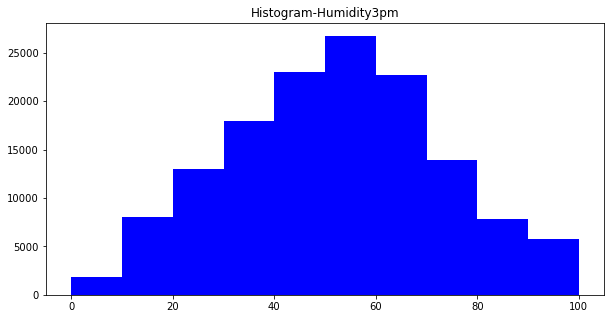

In [128]:
##Histogram
plt.hist(df.Humidity3pm,color='blue')
plt.xlabel=("Humidity3pm")
plt.title('Histogram-Humidity3pm')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [12]:
df["Humidity3pm"]=df.Humidity3pm.fillna(df.Humidity3pm.mean())

In [131]:
df.WindDir3pm.mode()

0    SE
dtype: object

In [13]:
df['WindDir3pm']=df['WindDir3pm'].fillna('SE')

In [135]:
df.Temp3pm.mean()

21.683390318009447

In [136]:
df.Temp3pm.median()

21.1

In [14]:
df["Temp3pm"]=df.Temp3pm.fillna(df.Temp3pm.mean())

In [141]:
df.RainTomorrow.mode()

0    No
dtype: object

In [15]:
df['RainTomorrow']=df['RainTomorrow'].fillna('No')

In [144]:
df.RainToday.mode()

0    No
dtype: object

In [16]:
df['RainToday']=df['RainToday'].fillna('No')

In [146]:
df.Rainfall.mean()

2.360918149917032

In [147]:
df.Rainfall.median()

0.0

<function matplotlib.pyplot.show(close=None, block=None)>

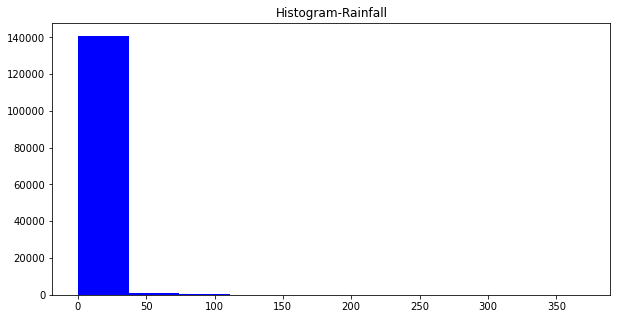

In [148]:
##Histogram
plt.hist(df.Rainfall,color='blue')
plt.xlabel=("Rainfall")
plt.title('Histogram-Rainfall')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [17]:
df["Rainfall"]=df.Rainfall.fillna(df.Rainfall.mean())

In [154]:
df.WindSpeed3pm.mean()

18.662656778887342

In [155]:
df.WindSpeed3pm.median()

19.0

<function matplotlib.pyplot.show(close=None, block=None)>

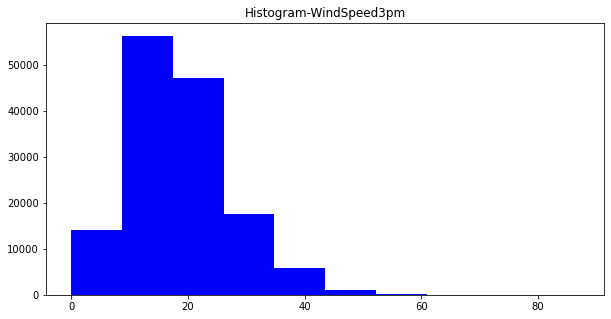

In [156]:
##Histogram
plt.hist(df.WindSpeed3pm,color='blue')
plt.xlabel=("WindSpeed3pm")
plt.title('Histogram-WindSpeed3pm')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [18]:
df["WindSpeed3pm"]=df.WindSpeed3pm.fillna(df.WindSpeed3pm.mean())

In [158]:
df.Humidity9am.mean()

68.88083133761887

In [159]:
df.Humidity9am.median()

70.0

<function matplotlib.pyplot.show(close=None, block=None)>

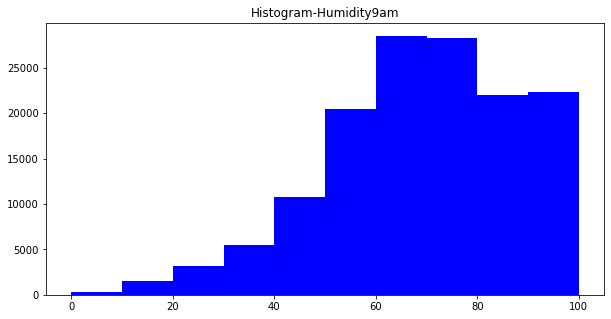

In [160]:
##Histogram
plt.hist(df.Humidity9am,color='blue')
plt.xlabel=("Humidity9am")
plt.title('Histogram-Humidity9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [19]:
df["Humidity9am"]=df.Humidity9am.fillna(df.Humidity9am.median())

In [162]:
df.WindSpeed9am.mean()

14.043425914971502

In [163]:
df.WindSpeed9am.median()

13.0

<function matplotlib.pyplot.show(close=None, block=None)>

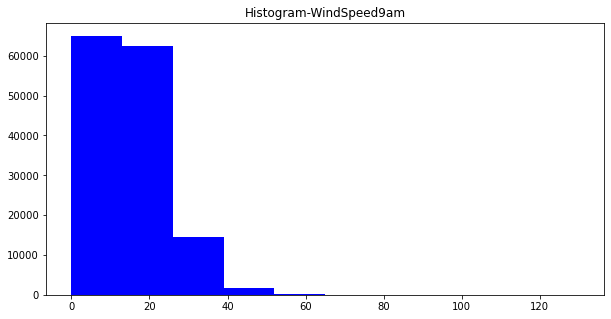

In [164]:
##Histogram
plt.hist(df.WindSpeed9am,color='blue')
plt.xlabel=("WindSpeed9am")
plt.title('Histogram-WindSpeed9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [20]:
df["WindSpeed9am"]=df.WindSpeed9am.fillna(df.WindSpeed9am.median())

In [166]:
df.Temp9am.mean()

16.990631415587448

In [167]:
df.Temp9am.median()

16.7

<function matplotlib.pyplot.show(close=None, block=None)>

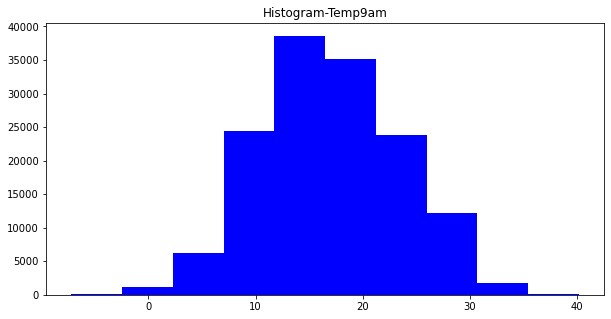

In [168]:
##Histogram
plt.hist(df.Temp9am,color='blue')
plt.xlabel=("Temp9am")
plt.title('Histogram-Temp9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [21]:
df["Temp9am"]=df.Temp9am.fillna(df.Temp9am.mean())

In [170]:
df.MinTemp.mean()

12.19403438096871

In [171]:
df.MinTemp.median()

12.0

In [22]:
df["MinTemp"]=df.MinTemp.fillna(df.MinTemp.mean())

In [173]:
df.MaxTemp.mean()

23.221348275647003

In [174]:
df.MaxTemp.median()

22.6

<function matplotlib.pyplot.show(close=None, block=None)>

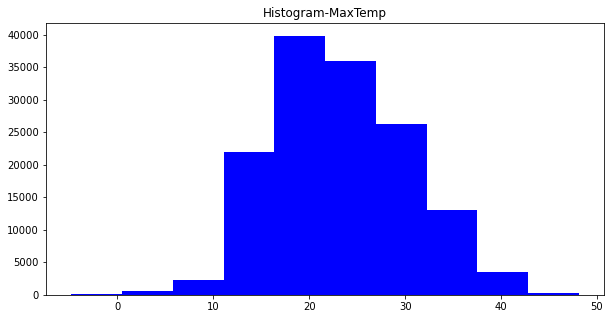

In [175]:
##Histogram
plt.hist(df.MaxTemp,color='blue')
plt.xlabel=("MaxTemp")
plt.title('Histogram-MaxTemp')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [23]:
df["MaxTemp"]=df.MaxTemp.fillna(df.MaxTemp.mean())

In [24]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [179]:
df.RainTomorrow.value_counts()

No     113583
Yes     31877
Name: RainTomorrow, dtype: int64

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

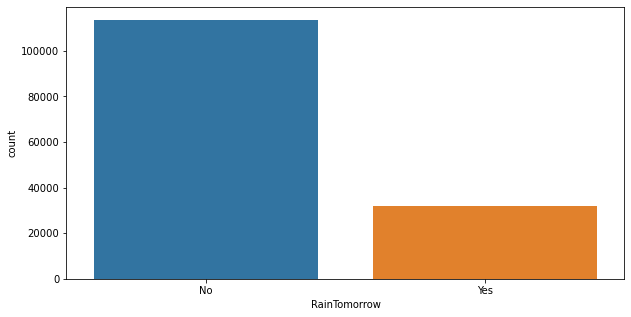

In [180]:
sns.countplot(df.RainTomorrow)

In [181]:
df.RainTomorrow.describe()

count     145460
unique         2
top           No
freq      113583
Name: RainTomorrow, dtype: object

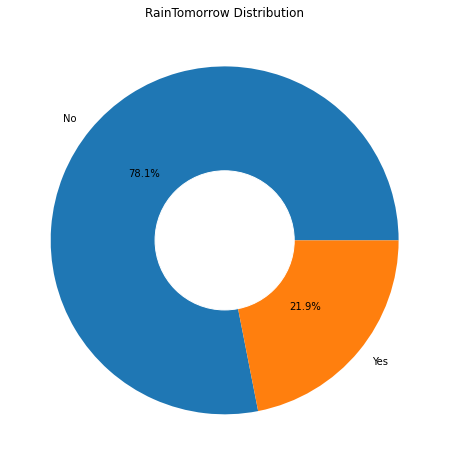

In [198]:
Frequency_by_RainTomorrow=df["RainTomorrow"].value_counts()
keys=Frequency_by_RainTomorrow.keys().to_list()
counts=Frequency_by_RainTomorrow.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("RainTomorrow Distribution")
plt.show()
        

In [25]:
df.Date = pd.to_datetime(df.Date)

In [185]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        145460 non-null  float64       
 3   MaxTemp        145460 non-null  float64       
 4   Rainfall       145460 non-null  float64       
 5   WindGustDir    145460 non-null  object        
 6   WindGustSpeed  145460 non-null  float64       
 7   WindDir9am     145460 non-null  object        
 8   WindDir3pm     145460 non-null  object        
 9   WindSpeed9am   145460 non-null  float64       
 10  WindSpeed3pm   145460 non-null  float64       
 11  Humidity9am    145460 non-null  float64       
 12  Humidity3pm    145460 non-null  float64       
 13  Pressure9am    145460 non-null  float64       
 14  Pressure3pm    145460 non-null  float64       
 15  

In [186]:
df.Date.value_counts()

2013-12-22    49
2016-08-02    49
2013-12-12    49
2015-06-22    49
2013-05-11    49
              ..
2007-12-17     1
2008-01-24     1
2007-11-17     1
2007-11-06     1
2007-11-10     1
Name: Date, Length: 3436, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

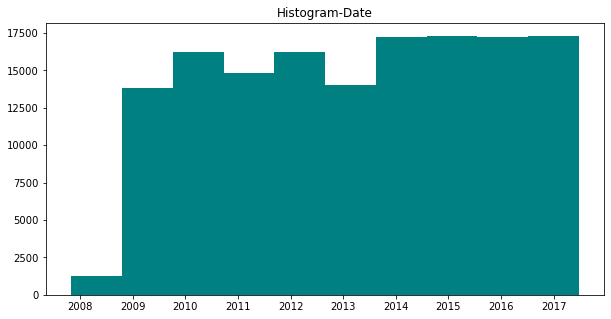

In [188]:
##Histogram
plt.hist(df.Date,color='teal')
plt.xlabel=("Date")
plt.title('Histogram-Date')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [189]:
df.groupby("RainTomorrow")["Date"].describe()

,count,unique,top,freq,first,last
RainTomorrow,,,,,,
No,113583,3399,2015-03-05,49,2007-11-05,2017-06-25
Yes,31877,3221,2010-09-03,40,2007-11-01,2017-06-25


In [194]:
df["Date"].mode()

0      2013-03-01
1      2013-03-02
2      2013-03-03
3      2013-03-04
4      2013-03-05
          ...    
1567   2017-06-20
1568   2017-06-21
1569   2017-06-22
1570   2017-06-23
1571   2017-06-24
Length: 1572, dtype: datetime64[ns]

In [195]:
df.Date.unique()

array(['2008-12-01T00:00:00.000000000', '2008-12-02T00:00:00.000000000',
       '2008-12-03T00:00:00.000000000', ...,
       '2008-01-29T00:00:00.000000000', '2008-01-30T00:00:00.000000000',
       '2008-01-31T00:00:00.000000000'], dtype='datetime64[ns]')

In [196]:
df.Location.value_counts()

Canberra            3436
Sydney              3344
Adelaide            3193
Hobart              3193
Melbourne           3193
Brisbane            3193
Perth               3193
Darwin              3193
Ballarat            3040
Launceston          3040
Bendigo             3040
Cairns              3040
Albany              3040
Wollongong          3040
Albury              3040
GoldCoast           3040
MountGinini         3040
MountGambier        3040
AliceSprings        3040
Townsville          3040
Tuggeranong         3039
Penrith             3039
Newcastle           3039
PerthAirport        3009
WaggaWagga          3009
Dartmoor            3009
Williamtown         3009
Richmond            3009
Mildura             3009
Cobar               3009
SydneyAirport       3009
MelbourneAirport    3009
Portland            3009
Woomera             3009
Sale                3009
PearceRAAF          3009
NorfolkIsland       3009
Moree               3009
BadgerysCreek       3009
Watsonia            3009


In [199]:
df.groupby("RainTomorrow")['Location'].describe()

,count,unique,top,freq
RainTomorrow,,,,
No,113583,49,Woomera,2807
Yes,31877,49,Portland,1095


In [202]:
df.groupby("Location")['RainTomorrow'].describe()

,count,unique,top,freq
Location,,,,
Adelaide,3193,2,No,2505
Albany,3040,2,No,2138
Albury,3040,2,No,2422
AliceSprings,3040,2,No,2796
BadgerysCreek,3009,2,No,2426
Ballarat,3040,2,No,2259
Bendigo,3040,2,No,2478
Brisbane,3193,2,No,2484
Cairns,3040,2,No,2090


In [200]:
df.groupby("RainToday")['Location'].describe()

,count,unique,top,freq
RainToday,,,,
No,113580,49,Woomera,2807
Yes,31880,49,Portland,1094


In [201]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        145460 non-null  float64       
 3   MaxTemp        145460 non-null  float64       
 4   Rainfall       145460 non-null  float64       
 5   WindGustDir    145460 non-null  object        
 6   WindGustSpeed  145460 non-null  float64       
 7   WindDir9am     145460 non-null  object        
 8   WindDir3pm     145460 non-null  object        
 9   WindSpeed9am   145460 non-null  float64       
 10  WindSpeed3pm   145460 non-null  float64       
 11  Humidity9am    145460 non-null  float64       
 12  Humidity3pm    145460 non-null  float64       
 13  Pressure9am    145460 non-null  float64       
 14  Pressure3pm    145460 non-null  float64       
 15  

<function matplotlib.pyplot.show(close=None, block=None)>

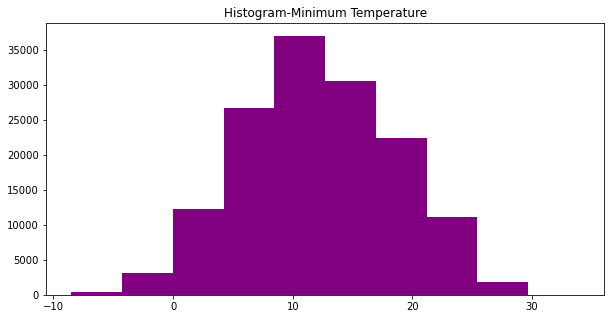

In [208]:
##Histogram
plt.hist(df.MinTemp,color='purple')
plt.xlabel=("MinTemp")
plt.title('Histogram-Minimum Temperature')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

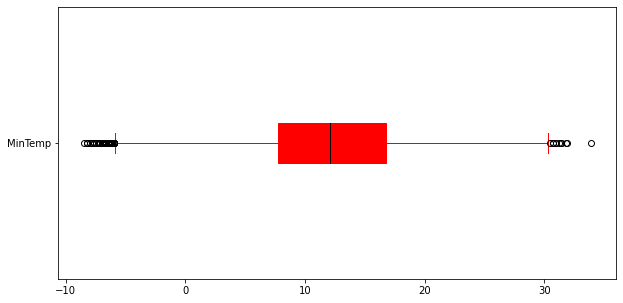

In [207]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.MinTemp.plot.box(color=props2, patch_artist = True, vert = False)

In [30]:
IQR=df.MinTemp.quantile(0.75)-df.MinTemp.quantile(0.25)
LL=df.MinTemp.quantile(0.25)-(1.5*IQR)
UL=df.MinTemp.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

IQR:  9.100000000000001
LL:  -5.950000000000002
UL:  30.450000000000003


In [32]:
UL_LEN=len(df.MinTemp[df.MinTemp>UL])
UL_LEN

11

In [33]:
UpperLimit_perc=UL_LEN/len(df)
UpperLimit_perc

7.562216416884367e-05

In [34]:
LL_LEN=len(df.MinTemp[df.MinTemp<LL])
LL_LEN

71

In [35]:
LowerLimit_perc=LL_LEN/len(df)
LowerLimit_perc

0.00048810669599890004

<AxesSubplot:xlabel='MinTemp', ylabel='Rainfall'>

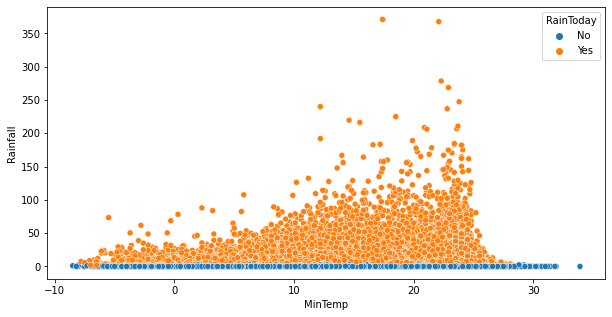

In [140]:
sns.scatterplot(x="MinTemp",y="Rainfall",data=df,hue='RainToday')

<AxesSubplot:xlabel='MinTemp', ylabel='Rainfall'>

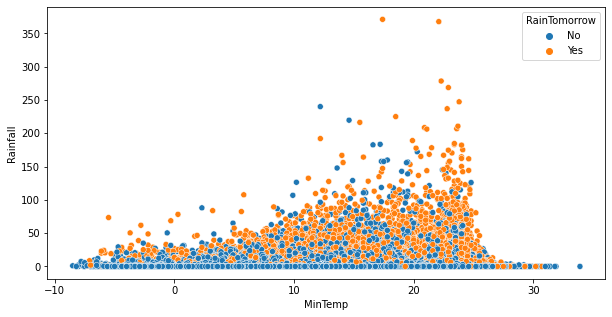

In [141]:
sns.scatterplot(x="MinTemp",y="Rainfall",data=df,hue='RainTomorrow')

In [36]:
df.groupby("RainTomorrow")['MinTemp'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,11.91692,6.356317,-8.5,7.4,11.9,16.5,33.9
Yes,31877.0,13.18144,6.301032,-7.2,8.5,12.7,17.9,30.7


<AxesSubplot:xlabel='RainTomorrow', ylabel='MinTemp'>

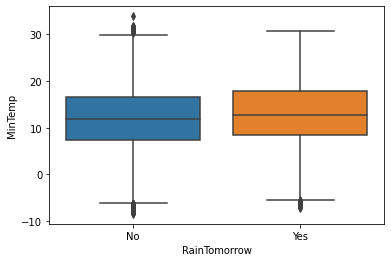

In [37]:
sns.boxplot(x="RainTomorrow",y="MinTemp",data=df)

<function matplotlib.pyplot.show(close=None, block=None)>

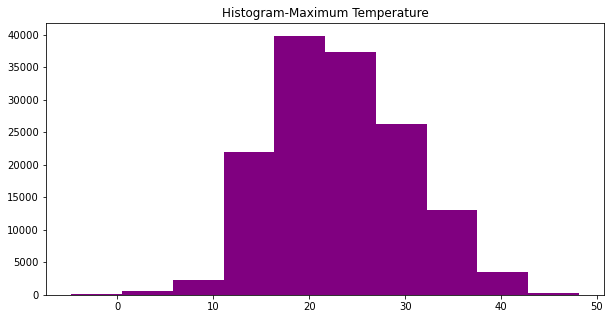

In [51]:
##Histogram
plt.hist(df.MaxTemp,color='purple')
plt.xlabel=("MaxTemp")
plt.title('Histogram-Maximum Temperature')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

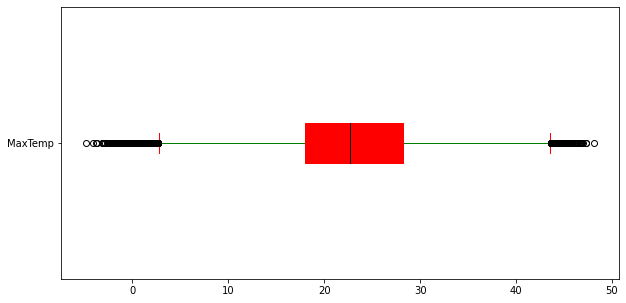

In [52]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.MaxTemp.plot.box(color=props2, patch_artist = True, vert = False)

In [53]:
IQR=df.MaxTemp.quantile(0.75)-df.MaxTemp.quantile(0.25)
LL=df.MaxTemp.quantile(0.25)-(1.5*IQR)
UL=df.MaxTemp.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

IQR:  10.2
LL:  2.700000000000001
UL:  43.5


In [54]:
UL_LEN=len(df.MaxTemp[df.MaxTemp>UL])
UL_LEN

184

In [55]:
UpperLimit_perc=UL_LEN/len(df)
UpperLimit_perc

0.0012649525642788395

In [56]:
LL_LEN=len(df.MaxTemp[df.MaxTemp<LL])
LL_LEN

360

In [57]:
LowerLimit_perc=LL_LEN/len(df)
LowerLimit_perc

0.002474907190980338

In [59]:
df.groupby("RainTomorrow")['MaxTemp'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,23.810325,7.026662,-4.8,18.6,23.221348,28.7,48.1
Yes,31877.0,21.122727,6.906071,-4.1,16.1,20.200000,25.8,46.8


<AxesSubplot:xlabel='MaxTemp', ylabel='Rainfall'>

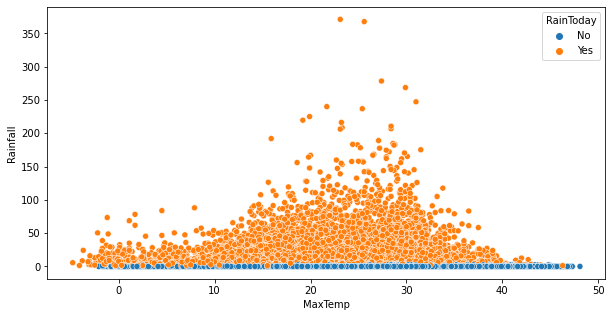

In [142]:
sns.scatterplot(x="MaxTemp",y="Rainfall",data=df,hue='RainToday')

<AxesSubplot:xlabel='MaxTemp', ylabel='Rainfall'>

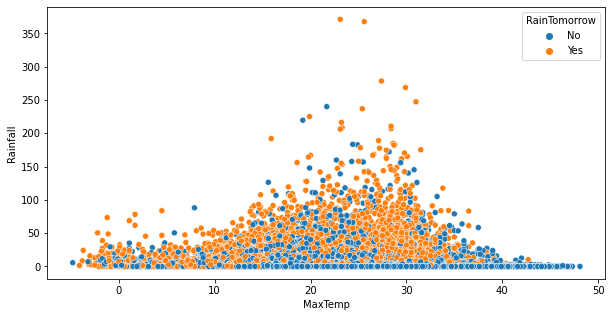

In [143]:
sns.scatterplot(x="MaxTemp",y="Rainfall",data=df,hue='RainTomorrow')

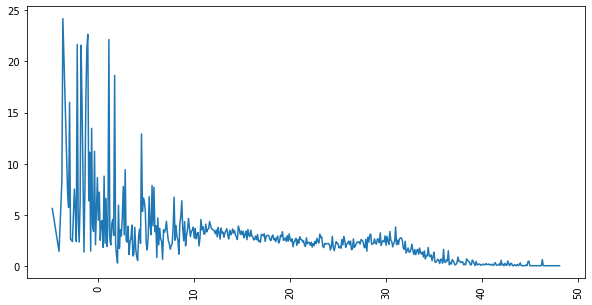

In [64]:
plt.plot(df.groupby("MaxTemp")["Rainfall"].mean())
#plt.rcParams['figure.figsize'] = [5,5]
plt.xticks(rotation=90)
plt.xlabel=("MaxTemp")
plt.ylabel=("Rainfall")
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

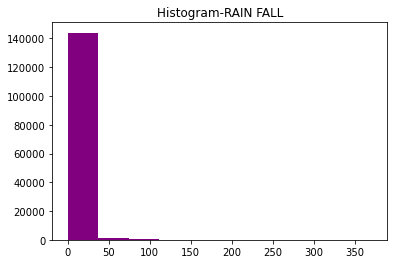

In [38]:
##Histogram
plt.hist(df.Rainfall,color='purple')
plt.xlabel=("Rainfall")
plt.title('Histogram-RAIN FALL')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

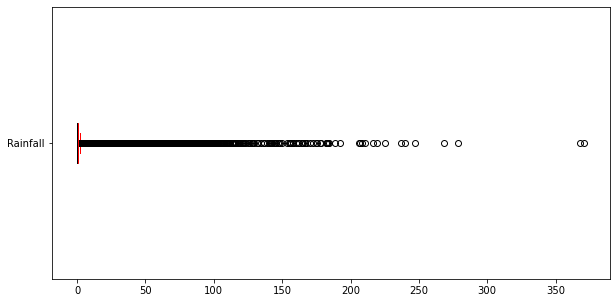

In [39]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Rainfall.plot.box(color=props2, patch_artist = True, vert = False)

In [40]:
IQR=df.Rainfall.quantile(0.75)-df.Rainfall.quantile(0.25)
LL=df.Rainfall.quantile(0.25)-(1.5*IQR)
UL=df.Rainfall.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

IQR:  1.0
LL:  -1.5
UL:  2.5


In [41]:
UL_LEN=len(df.Rainfall[df.Rainfall>UL])
UL_LEN

23723

In [42]:
UpperLimit_perc=UL_LEN/len(df)
UpperLimit_perc

0.1630895091434071

In [26]:
df = df[df['Rainfall'] < 24000]

In [44]:
df.shape

(145460, 21)

In [65]:
df.groupby("RainTomorrow")['Rainfall'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,1.322235,5.353933,0.0,0.0,0.0,0.2,240.0
Yes,31877.0,6.061919,14.176124,0.0,0.0,0.8,6.0,371.0


In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        145460 non-null  float64       
 3   MaxTemp        145460 non-null  float64       
 4   Rainfall       145460 non-null  float64       
 5   WindGustDir    145460 non-null  object        
 6   WindGustSpeed  145460 non-null  float64       
 7   WindDir9am     145460 non-null  object        
 8   WindDir3pm     145460 non-null  object        
 9   WindSpeed9am   145460 non-null  float64       
 10  WindSpeed3pm   145460 non-null  float64       
 11  Humidity9am    145460 non-null  float64       
 12  Humidity3pm    145460 non-null  float64       
 13  Pressure9am    145460 non-null  float64       
 14  Pressure3pm    145460 non-null  float64       
 15  

In [67]:
df.WindGustDir.value_counts()

W      20241
SE      9418
N       9313
SSE     9216
E       9181
S       9168
WSW     9069
SW      8967
SSW     8736
WNW     8252
NW      8122
ENE     8104
ESE     7372
NE      7133
NNW     6620
NNE     6548
Name: WindGustDir, dtype: int64

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

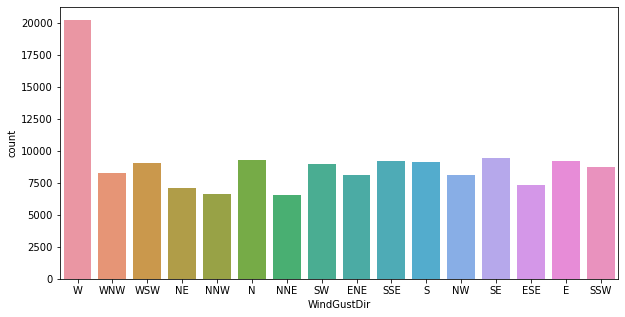

In [69]:
sns.countplot(df.WindGustDir)

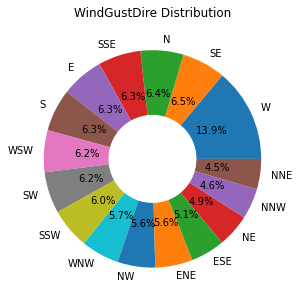

In [68]:
Frequency_by_WindGustDir=df["WindGustDir"].value_counts()
keys=Frequency_by_WindGustDir.keys().to_list()
counts=Frequency_by_WindGustDir.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("WindGustDire Distribution")
plt.show()
        

In [27]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [31]:
tukey=pairwise_tukeyhsd(df.WindGustSpeed,df.WindGustDir,alpha=0.05)
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     E    ENE  -2.5498  0.001  -3.222 -1.8775   True
     E    ESE  -0.2733    0.9  -0.963  0.4165  False
     E      N   3.6888  0.001  3.0401  4.3374   True
     E     NE  -1.9719  0.001  -2.668 -1.2757   True
     E    NNE  -0.0818    0.9 -0.7952  0.6317  False
     E    NNW    2.892  0.001  2.1809  3.6032   True
     E     NW   5.5077  0.001  4.8359  6.1796   True
     E      S   3.0369  0.001  2.3857  3.6882   True
     E     SE   0.6545  0.044  0.0076  1.3014   True
     E    SSE   1.5526  0.001  0.9022  2.2029   True
     E    SSW   2.3063  0.001  1.6471  2.9656   True
     E     SW   2.4975  0.001  1.8427  3.1524   True
     E      W   4.4566  0.001  3.9016  5.0115   True
     E    WNW   6.9655  0.001  6.2965  7.6346   True
     E    WSW   4.9091  0.001  4.2562  5.5621   True
   ENE    ESE   2.2765  0.001  1.5666  2.9864 

In [35]:
df['WindGustDir'] =df['WindGustDir'].replace({'E':'ESE,E,NNE,NE comb',
                                                             'ESE':'ESE,E,NNE,NE comb',
                                                             'NNE':'ESE,E,NNE,NE comb',
                                             'NE':'ESE,E,NNE,NE comb',
                                             'S':'S,NNW,SSW,SE comb',
                                             'NNW':'S,NNW,SSW,SE comb',
                                             'SSW':'S,NNW,SSW,SE comb',
                                             'SW':'S,NNW,SSW,SE comb',
                                             'NW':'NW,WSW,W comb',
                                             'WSW':'NW,WSW,W comb',
                                             'W':'NW,WSW,W comb'})

In [36]:
df['WindGustDir'].value_counts()

NW,WSW,W comb        37432
S,NNW,SSW,SE comb    33491
ESE,E,NNE,NE comb    30234
SE                    9418
N                     9313
SSE                   9216
WNW                   8252
ENE                   8104
Name: WindGustDir, dtype: int64

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

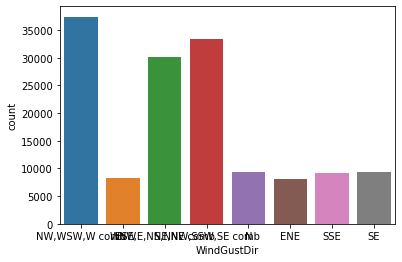

In [37]:
sns.countplot(df.WindGustDir)

Text(0.5, 1.0, 'WindGustDir with RainTomorrow')

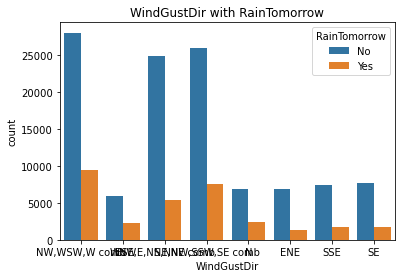

In [39]:
sns.countplot(x='WindGustDir',hue="RainTomorrow",data=df)
plt.xlabel=("WindGustDir")
plt.ylabel=("Counts")
plt.rcParams['figure.figsize'] = [10,8]
plt.title("WindGustDir with RainTomorrow")

<AxesSubplot:xlabel='WindGustDir', ylabel='Rainfall'>

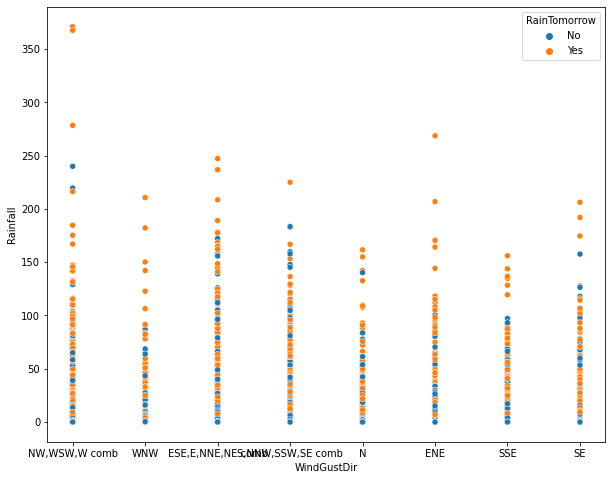

In [42]:
sns.scatterplot(x='WindGustDir',y='Rainfall',data=df,hue='RainTomorrow')

<function matplotlib.pyplot.show(close=None, block=None)>

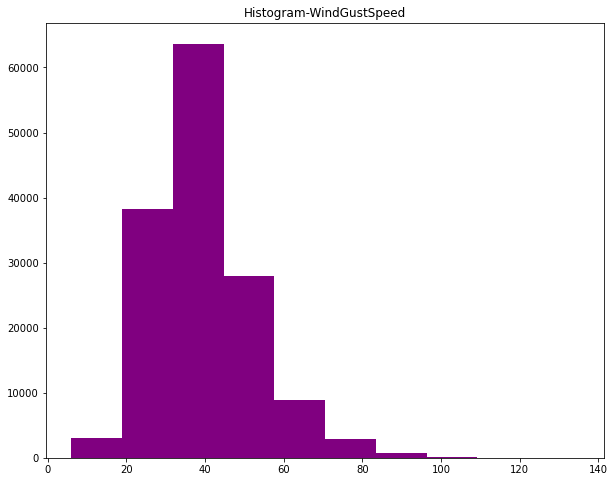

In [43]:
##Histogram
plt.hist(df.WindGustSpeed,color='purple')
plt.xlabel=("WindGustSpeed")
plt.title('Histogram-WindGustSpeed')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

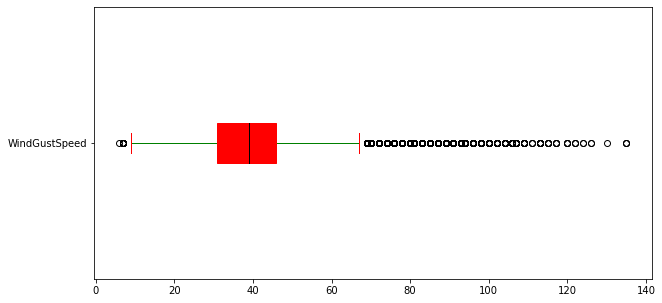

In [44]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.WindGustSpeed.plot.box(color=props2, patch_artist = True, vert = False)

In [45]:
IQR=df.WindGustSpeed.quantile(0.75)-df.WindGustSpeed.quantile(0.25)
LL=df.WindGustSpeed.quantile(0.25)-(1.5*IQR)
UL=df.WindGustSpeed.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)



IQR:  15.0
LL:  8.5
UL:  68.5


In [47]:
UL_LEN=len(df.WindGustSpeed[df.WindGustSpeed>UL])
UL_LEN

5503

In [48]:
UpperLimit_perc=UL_LEN/len(df)
UpperLimit_perc

0.03783170631101334

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Rainfall'>

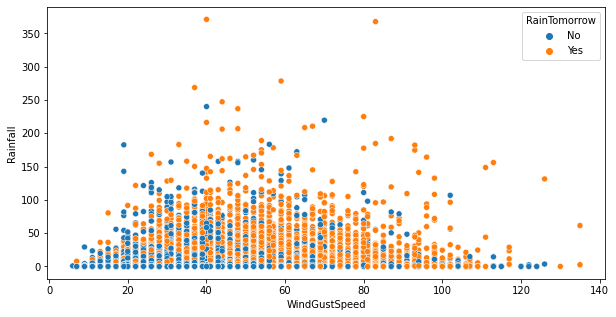

In [49]:
sns.scatterplot(x='WindGustSpeed',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Rainfall'>

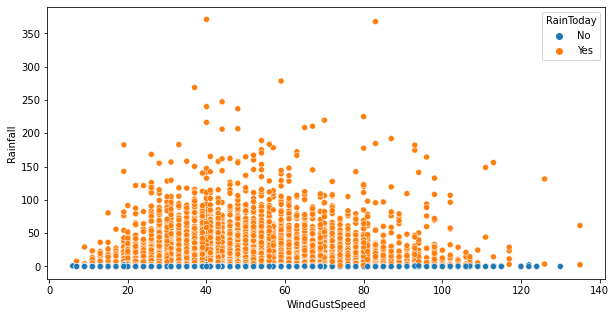

In [51]:
sns.scatterplot(x='WindGustSpeed',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='WindGustSpeed', ylabel='WindGustDir'>

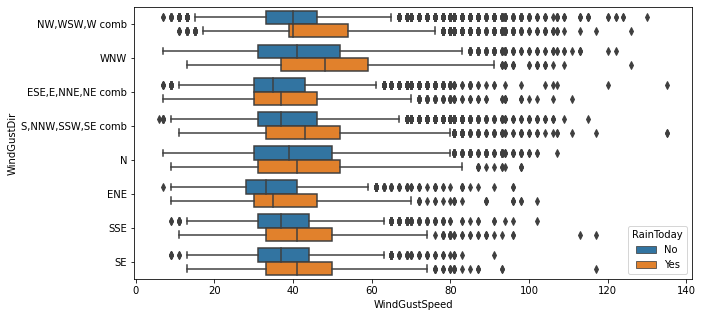

In [52]:
sns.boxplot(x='WindGustSpeed',y="WindGustDir",data=df,hue='RainToday')

In [53]:
df.WindDir9am.value_counts()

N      22324
SE      9287
E       9176
SSE     9112
NW      8749
S       8659
W       8459
SW      8423
NNE     8129
NNW     7980
ENE     7836
NE      7671
ESE     7630
SSW     7587
WNW     7414
WSW     7024
Name: WindDir9am, dtype: int64

In [54]:
tukey=pairwise_tukeyhsd(df.Rainfall,df.WindDir9am,alpha=0.05)
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     E    ENE    0.017    0.9 -0.4228  0.4567  False
     E    ESE   0.3806 0.1936 -0.0624  0.8235  False
     E      N   0.2083 0.7912 -0.1462  0.5628  False
     E     NE   0.1497    0.9 -0.2926   0.592  False
     E    NNE  -0.1346    0.9 -0.5701  0.3008  False
     E    NNW   0.8144  0.001  0.3768   1.252   True
     E     NW   1.0197  0.001  0.5926  1.4469   True
     E      S   1.8858  0.001  1.4575  2.3142   True
     E     SE   0.9115  0.001  0.4907  1.3323   True
     E    SSE   1.1645  0.001  0.7417  1.5873   True
     E    SSW   2.0441  0.001  1.6005  2.4878   True
     E     SW    2.356  0.001  1.9246  2.7875   True
     E      W   1.7585  0.001  1.3276  2.1894   True
     E    WNW    1.504  0.001  1.0576  1.9505   True
     E    WSW   2.0361  0.001  1.5829  2.4894   True
   ENE    ESE   0.3636 0.3245 -0.0962  0.8234 

In [70]:
df['WindDir9am'] =df['WindDir9am'].replace({'E':'ENE,E,NNE,NE,N,ESE comb',
                                                             'ENE':'ENE,E,NNE,NE,N,ESE comb',
                                                             'NNE':'ENE,E,NNE,NE,N,ESE comb',
                                             'NE':'ENE,E,NNE,NE,N,ESE comb',
                                             'N':'ENE,E,NNE,NE,N,ESE comb',
                                            'ESE':'ENE,E,NNE,NE,N,ESE comb',
                                             'NNW':'NNW,NW,SE,SSE comb',
                                             'NW':'NNW,NW,SE,SSE comb',
                                             'SE':'NNW,NW,SE,SSE comb',
                                             'SSE':'NNW,NW,SE,SSE comb',
                                             'S':'S,SSW,W,WNW,WSW,SW comb',
                                             'SSW':'S,SSW,W,WNW,WSW,SW comb',
                                           'W':'S,SSW,W,WNW,WSW,SW comb',
                                           'WNW':'S,SSW,W,WNW,WSW,SW comb',
                                           'WSW':'S,SSW,W,WNW,WSW,SW comb',
                                           'SW':'S,SSW,W,WNW,WSW,SW comb'})

In [61]:
df['WindDir9am'].value_counts()

ENE,E,NNE,NE,N,ESE comb    62766
S,SSW,W,WNW,WSW,SW comb    56678
NNW,NW,SE,SSE comb         26016
Name: WindDir9am, dtype: int64

<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

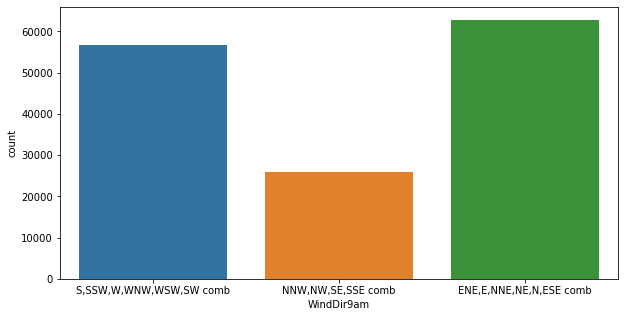

In [62]:
sns.countplot(df.WindDir9am)

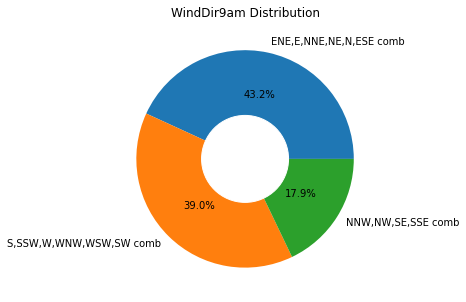

In [63]:
Frequency_by_WindDir9am=df["WindDir9am"].value_counts()
keys=Frequency_by_WindDir9am.keys().to_list()
counts=Frequency_by_WindDir9am.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("WindDir9am Distribution")
plt.show()
        

Text(0.5, 1.0, 'WindDir9am with RainTomorrow')

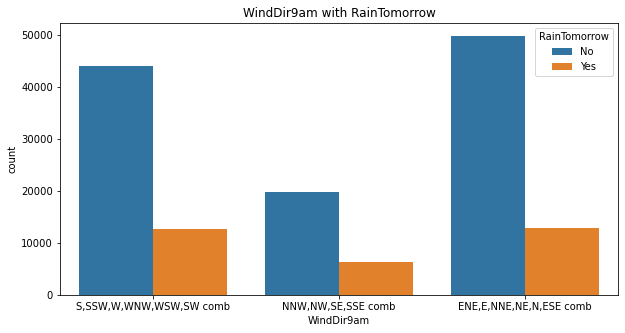

In [64]:
sns.countplot(x='WindDir9am',hue="RainTomorrow",data=df)
plt.xlabel=("WindDir9am")
plt.ylabel=("Counts")
plt.rcParams['figure.figsize'] = [10,8]
plt.title("WindDir9am with RainTomorrow")

<AxesSubplot:xlabel='WindDir9am', ylabel='Rainfall'>

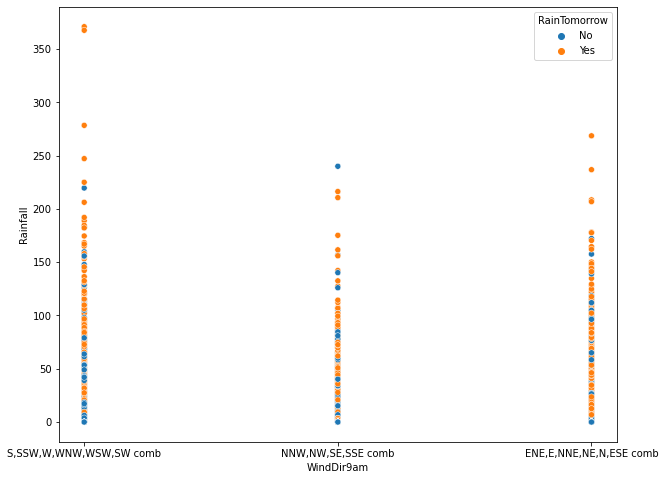

In [65]:
sns.scatterplot(x='WindDir9am',y='Rainfall',data=df,hue='RainTomorrow')

In [66]:
df.WindDir3pm.value_counts()

SE     15066
W      10110
S       9926
WSW     9518
SSE     9399
SW      9354
N       8890
WNW     8874
NW      8610
ESE     8505
E       8472
NE      8263
SSW     8156
NNW     7870
ENE     7857
NNE     6590
Name: WindDir3pm, dtype: int64

In [67]:
tukey=pairwise_tukeyhsd(df.Rainfall,df.WindDir3pm,alpha=0.05)
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     E    ENE   0.0106    0.9 -0.4384  0.4595  False
     E    ESE   0.1407    0.9 -0.2992  0.5807  False
     E      N  -0.4698 0.0199  -0.905 -0.0346   True
     E     NE  -0.4123 0.1024 -0.8555  0.0308  False
     E    NNE  -0.4002 0.2087  -0.871  0.0706  False
     E    NNW   -0.238    0.9 -0.6867  0.2108  False
     E     NW   0.2103    0.9 -0.2284  0.6489  False
     E      S   0.9926  0.001  0.5686  1.4166   True
     E     SE   0.6474  0.001  0.2581  1.0366   True
     E    SSE   0.8029  0.001  0.3734  1.2323   True
     E    SSW   1.3202  0.001  0.8756  1.7649   True
     E     SW   0.6762  0.001  0.2463  1.1061   True
     E      W   0.8706  0.001  0.4484  1.2928   True
     E    WNW    0.687  0.001  0.2516  1.1224   True
     E    WSW   0.8309  0.001  0.4028  1.2591   True
   ENE    ESE   0.1302    0.9 -0.3184  0.5787 

In [ ]:
e=ene=ese=ne=nne=nnw=nw=n  s=se=sse=ssw=sw=w=wnw=wsw

In [71]:
df['WindDir3pm'] =df['WindDir3pm'].replace({'E':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                                             'ENE':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                                             'ESE':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                             'NE':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                             'NNE':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                            'NNW':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                             'NW':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                             'N':'E,ENE,ESE,NE,NNE,NNW,NW,N comb',
                                             'S':'S,SE,SE,S,WNW,WSW COMB',
                                             'SE':'S,SE,SE,S,WNW,WSW COMB',
                                             'SSE':'S,SE,SE,S,WNW,WSW COMB',
                                           'SSW':'S,SE,SE,S,WNW,WSW COMB',
                                           'SW':'S,SE,SE,S,WNW,WSW COMB',
                                           'W':'S,SE,SE,S,WNW,WSW COMB',
                                           'WNW':'S,SE,SE,S,WNW,WSW COMB',
                                           'WSW':'S,SE,SE,S,WNW,WSW COMB'})

In [72]:
df['WindDir3pm'].value_counts()

S,SE,SE,S,WNW,WSW COMB            80403
E,ENE,ESE,NE,NNE,NNW,NW,N comb    65057
Name: WindDir3pm, dtype: int64

<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

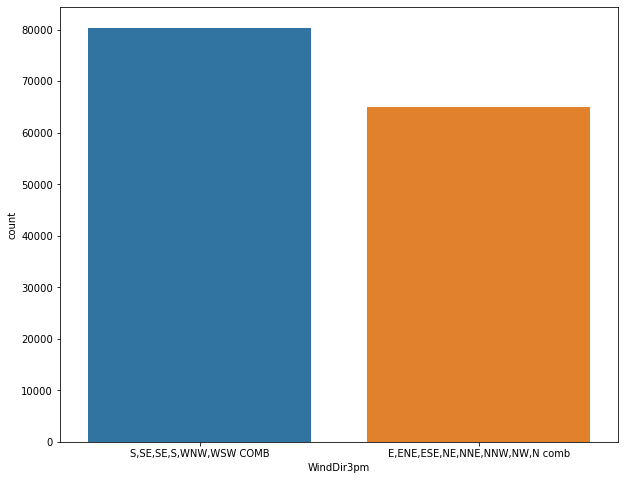

In [73]:
sns.countplot(df.WindDir3pm)

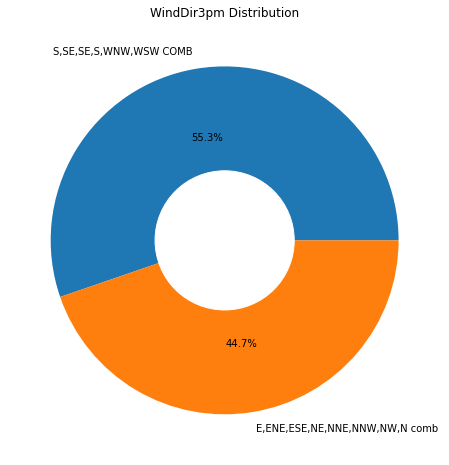

In [76]:
Frequency_by_WindDir3pm=df["WindDir3pm"].value_counts()
keys=Frequency_by_WindDir3pm.keys().to_list()
counts=Frequency_by_WindDir3pm.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("WindDir3pm Distribution")
plt.show()
        

Text(0.5, 1.0, 'WindDir3pm with RainTomorrow')

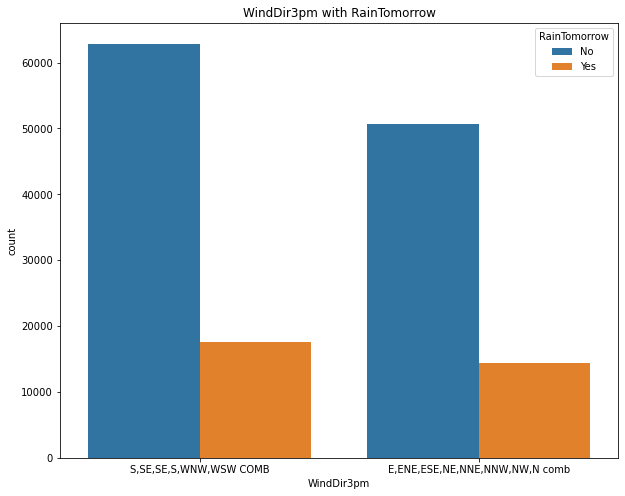

In [74]:
sns.countplot(x='WindDir3pm',hue="RainTomorrow",data=df)
plt.xlabel=("WindDir3pm")
plt.ylabel=("Counts")
plt.rcParams['figure.figsize'] = [10,8]
plt.title("WindDir3pm with RainTomorrow")

<AxesSubplot:xlabel='WindDir3pm', ylabel='Rainfall'>

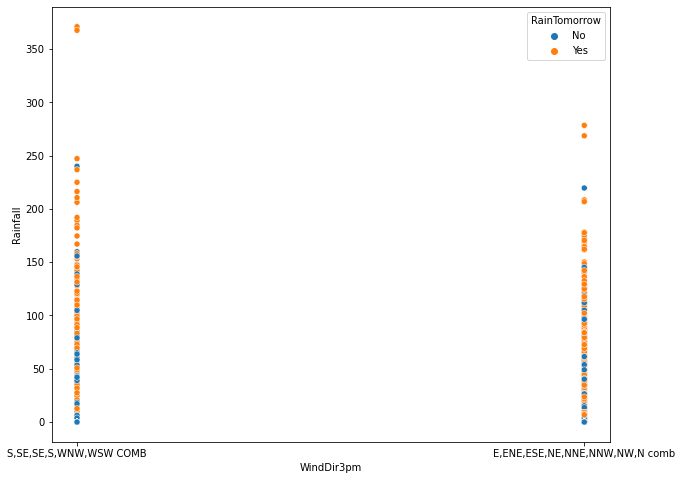

In [75]:
sns.scatterplot(x='WindDir3pm',y='Rainfall',data=df,hue='RainTomorrow')

<function matplotlib.pyplot.show(close=None, block=None)>

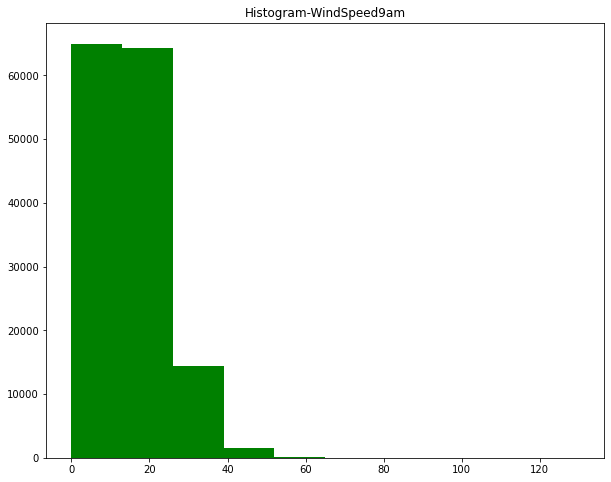

In [77]:
##Histogram
plt.hist(df.WindSpeed9am,color='green')
plt.xlabel=("WindSpeed9am")
plt.title('Histogram-WindSpeed9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

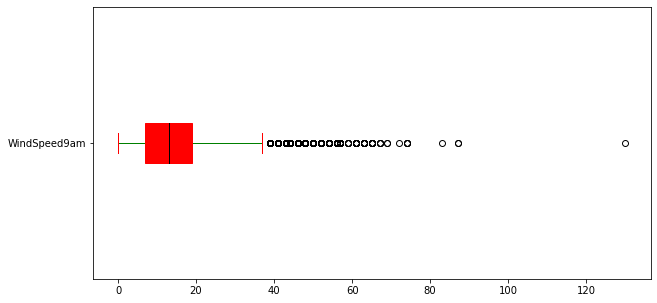

In [78]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.WindSpeed9am.plot.box(color=props2, patch_artist = True, vert = False)

In [79]:
IQR=df.WindSpeed9am.quantile(0.75)-df.WindSpeed9am.quantile(0.25)
LL=df.WindSpeed9am.quantile(0.25)-(1.5*IQR)
UL=df.WindSpeed9am.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

IQR:  12.0
LL:  -11.0
UL:  37.0


In [80]:
UL_LEN=len(df.WindSpeed9am[df.WindSpeed9am>UL])
UL_LEN

1817

In [81]:
UpperLimit_perc=UL_LEN/len(df)
UpperLimit_perc

0.01249140657225354

In [94]:
df.groupby("RainTomorrow")["WindSpeed9am"].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,13.623509,8.612001,0.0,7.0,13.0,19.0,130.0
Yes,31877.0,15.481821,9.559830,0.0,9.0,15.0,20.0,87.0


<AxesSubplot:xlabel='WindSpeed9am', ylabel='Rainfall'>

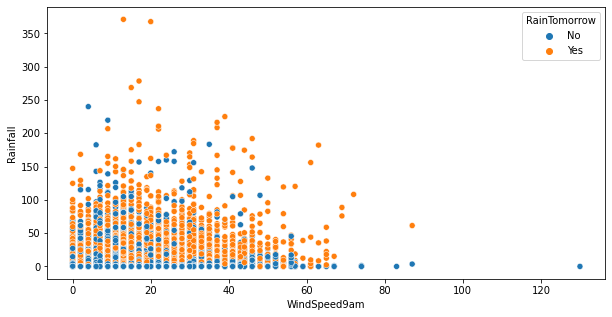

In [82]:
sns.scatterplot(x='WindSpeed9am',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Rainfall'>

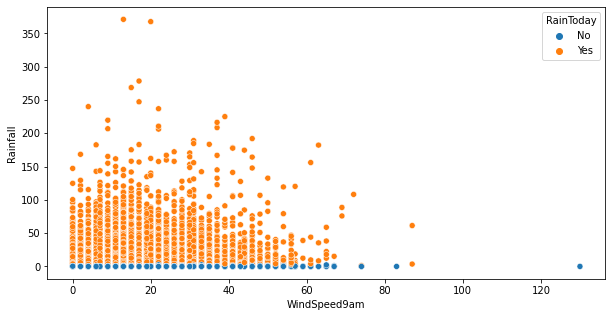

In [83]:
sns.scatterplot(x='WindSpeed9am',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='WindSpeed9am', ylabel='WindGustDir'>

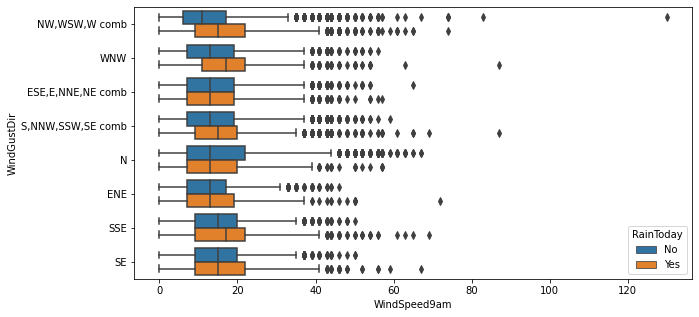

In [84]:
sns.boxplot(x='WindSpeed9am',y="WindGustDir",data=df,hue='RainToday')

<function matplotlib.pyplot.show(close=None, block=None)>

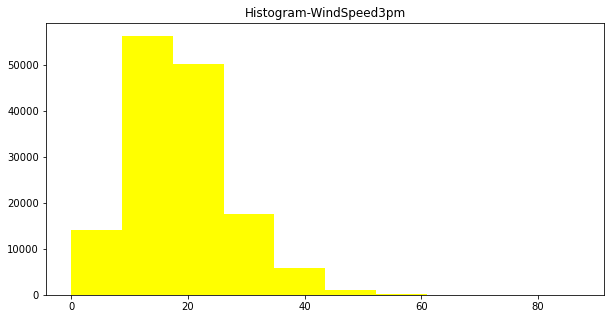

In [85]:
##Histogram
plt.hist(df.WindSpeed3pm,color='yellow')
plt.xlabel=("WindSpeed3pm")
plt.title('Histogram-WindSpeed3pm')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

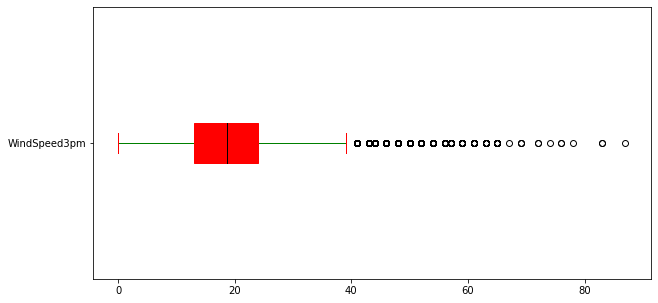

In [86]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.WindSpeed3pm.plot.box(color=props2, patch_artist = True, vert = False)

In [90]:
IQR=df.WindSpeed3pm.quantile(0.75)-df.WindSpeed3pm.quantile(0.25)
LL=df.WindSpeed3pm.quantile(0.25)-(1.5*IQR)
UL=df.WindSpeed3pm.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

UL_LEN=len(df.WindSpeed3pm[df.WindSpeed3pm>UL])
print('Outliers above ul :',UL_LEN)
      
UpperLimit_perc=UL_LEN/len(df)
print('Upper limit OL: perc :',UpperLimit_perc)

IQR:  11.0
LL:  -3.5
UL:  40.5
Outliers above ul : 2523
Upper limit OL: perc : 0.01734497456345387


In [93]:
df.groupby("RainTomorrow")['WindSpeed3pm'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,18.273813,8.385847,0.0,13.0,18.662657,24.0,83.0
Yes,31877.0,20.048172,9.678721,0.0,13.0,19.000000,26.0,87.0


<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

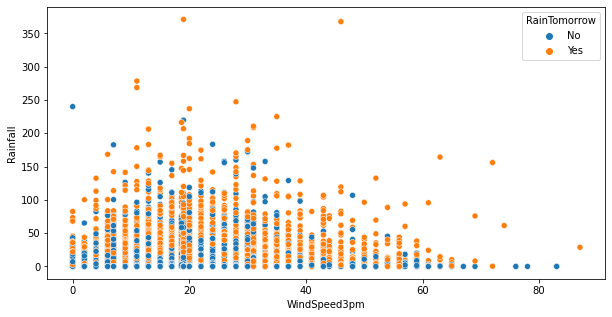

In [91]:
sns.scatterplot(x='WindSpeed3pm',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

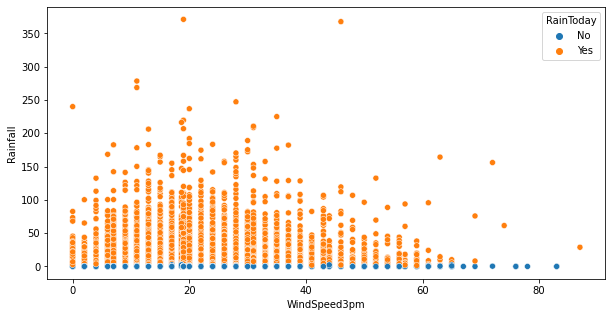

In [95]:
sns.scatterplot(x='WindSpeed3pm',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='WindGustDir'>

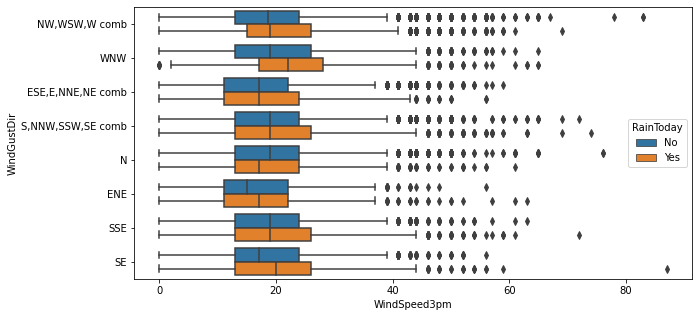

In [96]:
sns.boxplot(x='WindSpeed3pm',y="WindGustDir",data=df,hue='RainToday')

<function matplotlib.pyplot.show(close=None, block=None)>

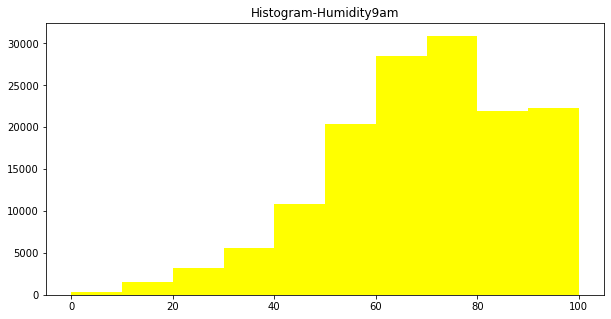

In [113]:
##Histogram
plt.hist(df.Humidity9am,color='yellow')
plt.xlabel=("Humidity9am")
plt.title('Histogram-Humidity9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

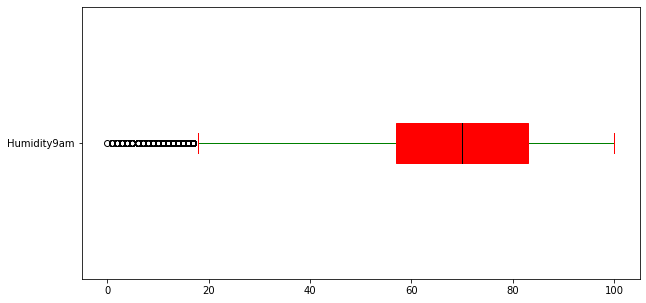

In [114]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Humidity9am.plot.box(color=props2, patch_artist = True, vert = False)

In [116]:
IQR=df.Humidity9am.quantile(0.75)-df.Humidity9am.quantile(0.25)
LL=df.Humidity9am.quantile(0.25)-(1.5*IQR)
UL=df.Humidity9am.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

UL_LEN=len(df.Humidity9am[df.Humidity9am>UL])
print('Outliers above ul :',UL_LEN)
      
UpperLimit_perc=UL_LEN/len(df)
print('Upper limit OL: perc :',UpperLimit_perc)

LL_LEN=len(df.Humidity9am[df.Humidity9am<LL])
print('Outliers below ll :',LL_LEN)

LowerLimit_perc=LL_LEN/len(df)
print('Lower limit OL: perc :',LowerLimit_perc)

IQR:  26.0
LL:  18.0
UL:  122.0
Outliers above ul : 0
Upper limit OL: perc : 0.0
Outliers below ll : 1425
Lower limit OL: perc : 0.00979650763096384


In [117]:
df.groupby("RainTomorrow")['Humidity9am'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,66.389909,18.831568,0.0,55.0,68.0,79.0,100.0
Yes,31877.0,77.849578,16.005708,5.0,68.0,80.0,91.0,100.0


<AxesSubplot:xlabel='Humidity9am', ylabel='Rainfall'>

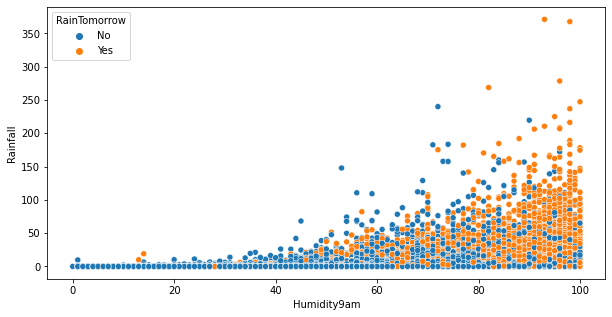

In [118]:
sns.scatterplot(x='Humidity9am',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Humidity9am', ylabel='WindSpeed9am'>

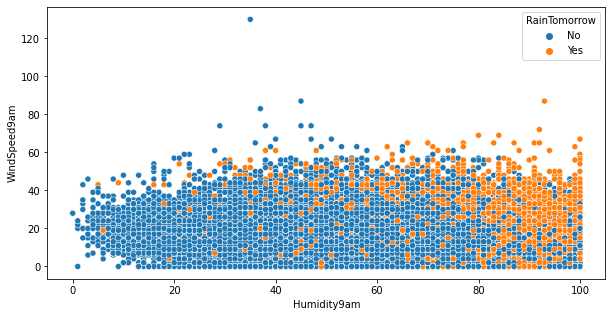

In [128]:
sns.scatterplot(x='Humidity9am',y='WindSpeed9am',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Humidity9am', ylabel='WindSpeed9am'>

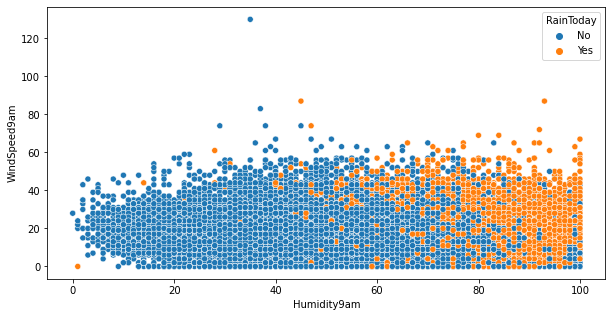

In [127]:
sns.scatterplot(x='Humidity9am',y='WindSpeed9am',data=df,hue='RainToday')

In [ ]:
sns.scatterplot(x='Humidity9am',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Humidity9am', ylabel='WindGustDir'>

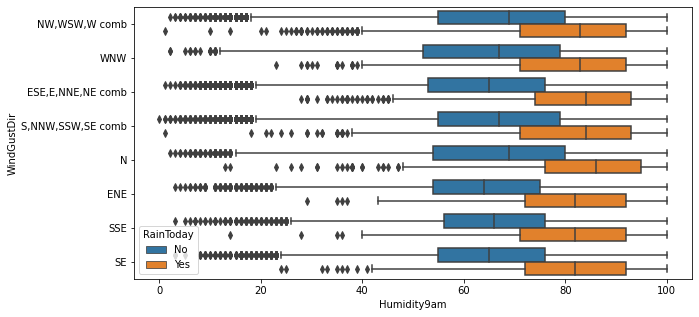

In [120]:
sns.boxplot(x='Humidity9am',y="WindGustDir",data=df,hue='RainToday')

<function matplotlib.pyplot.show(close=None, block=None)>

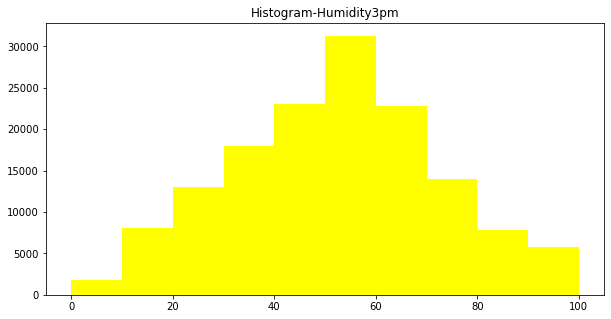

In [121]:
##Histogram
plt.hist(df.Humidity3pm,color='yellow')
plt.xlabel=("Humidity3pm")
plt.title('Histogram-Humidity3pm')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

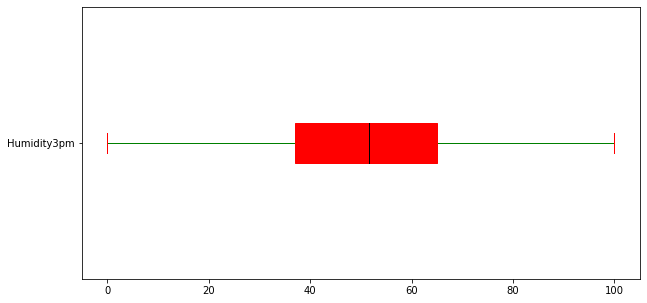

In [122]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Humidity3pm.plot.box(color=props2, patch_artist = True, vert = False)

In [123]:
df.groupby("RainTomorrow")['Humidity3pm'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,46.841350,18.299977,0.0,34.0,48.0,60.0,100.0
Yes,31877.0,68.278028,18.978944,1.0,55.0,69.0,83.0,100.0


<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

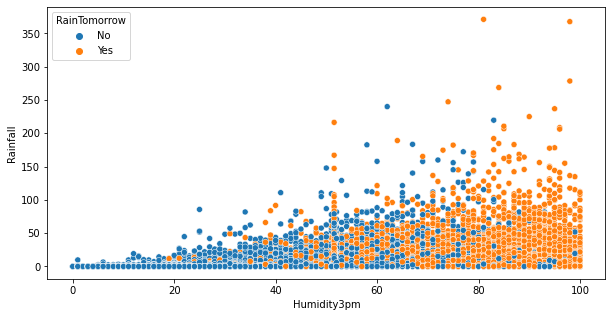

In [125]:
sns.scatterplot(x='Humidity3pm',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

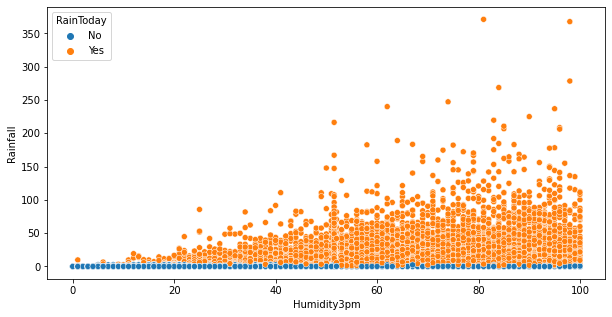

In [126]:
sns.scatterplot(x='Humidity3pm',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Humidity3pm', ylabel='WindSpeed3pm'>

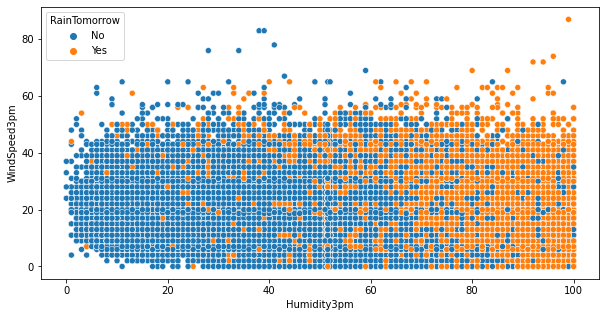

In [130]:
sns.scatterplot(x='Humidity3pm',y='WindSpeed3pm',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Humidity3pm', ylabel='WindSpeed3pm'>

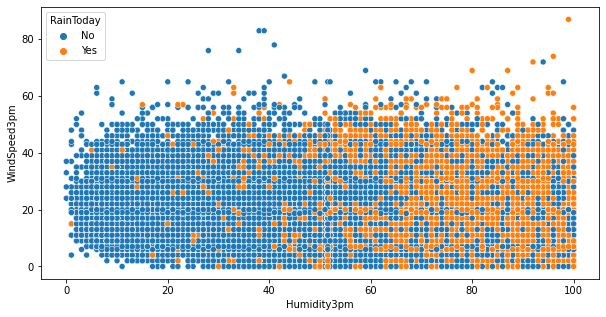

In [129]:
sns.scatterplot(x='Humidity3pm',y='WindSpeed3pm',data=df,hue='RainToday')

<function matplotlib.pyplot.show(close=None, block=None)>

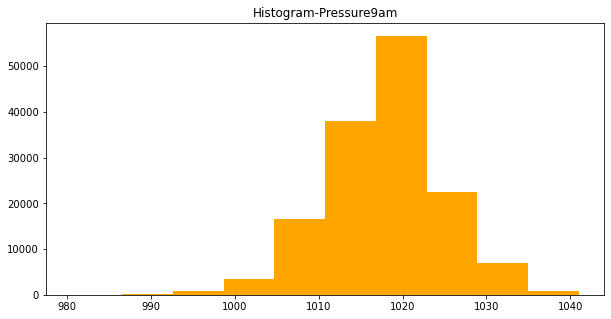

In [145]:
##Histogram
plt.hist(df.Pressure9am,color='orange')
plt.xlabel=("Pressure9am")
plt.title('Histogram-Pressure9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

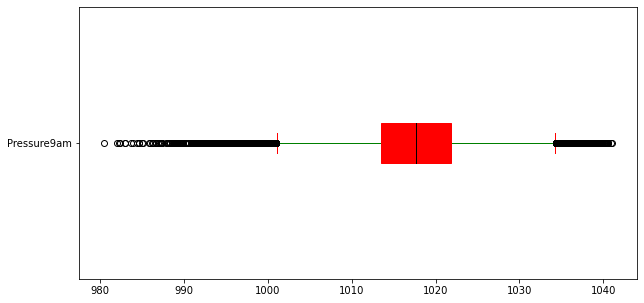

In [133]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Pressure9am.plot.box(color=props2, patch_artist = True, vert = False)

In [134]:
IQR=df.Pressure9am.quantile(0.75)-df.Pressure9am.quantile(0.25)
LL=df.Pressure9am.quantile(0.25)-(1.5*IQR)
UL=df.Pressure9am.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

UL_LEN=len(df.Pressure9am[df.Pressure9am>UL])
print('Outliers above ul :',UL_LEN)
      
UpperLimit_perc=UL_LEN/len(df)
print('Upper limit OL: perc :',UpperLimit_perc)

LL_LEN=len(df.Pressure9am[df.Pressure9am<LL])
print('Outliers below ll :',LL_LEN)

LowerLimit_perc=LL_LEN/len(df)
print('Lower limit OL: perc :',LowerLimit_perc)

IQR:  8.299999999999955
LL:  1001.0500000000001
UL:  1034.25
Outliers above ul : 1165
Upper limit OL: perc : 0.008009074659700261
Outliers below ll : 1593
Lower limit OL: perc : 0.010951464320087997


In [135]:
df.groupby("RainTomorrow")['Pressure9am'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,1018.473248,6.411603,982.9,1014.6,1017.64994,1022.5,1041.0
Yes,31877.0,1014.716359,7.006295,980.5,1010.2,1015.30000,1018.7,1039.5


<AxesSubplot:xlabel='Pressure9am', ylabel='Rainfall'>

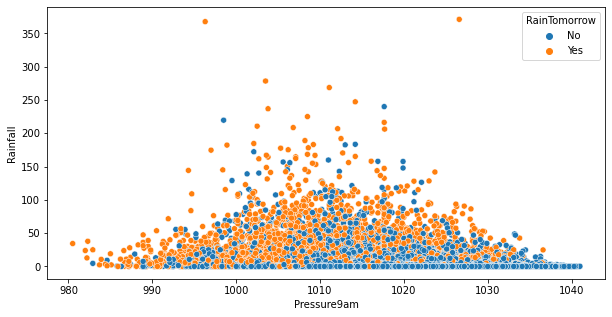

In [136]:
sns.scatterplot(x='Pressure9am',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Pressure9am', ylabel='Rainfall'>

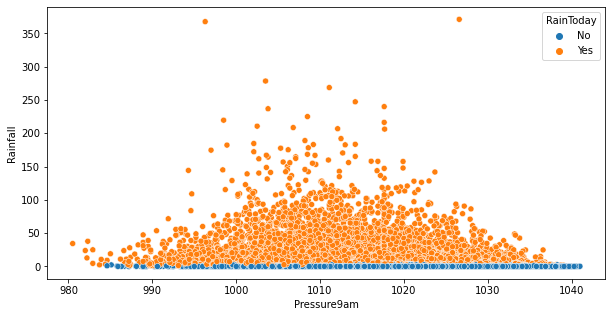

In [137]:
sns.scatterplot(x='Pressure9am',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Pressure9am', ylabel='Humidity9am'>

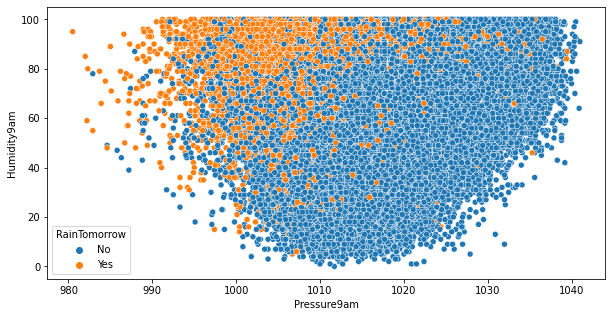

In [138]:
sns.scatterplot(x='Pressure9am',y='Humidity9am',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Pressure9am', ylabel='Humidity9am'>

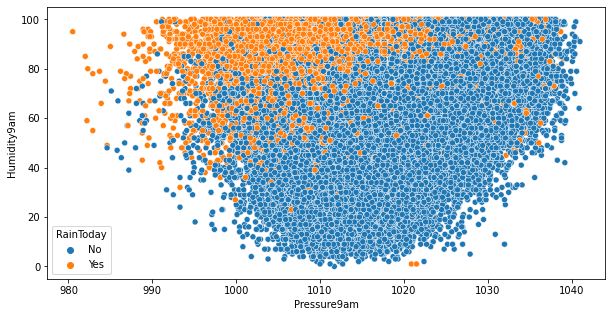

In [139]:
sns.scatterplot(x='Pressure9am',y='Humidity9am',data=df,hue='RainToday')

<function matplotlib.pyplot.show(close=None, block=None)>

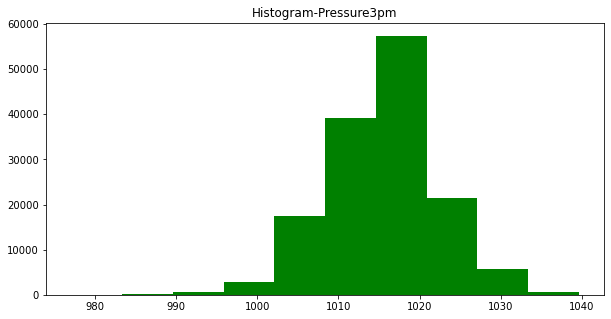

In [148]:
##Histogram
plt.hist(df.Pressure3pm,color='green')
plt.xlabel=("Pressure3pm")
plt.title('Histogram-Pressure3pm')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

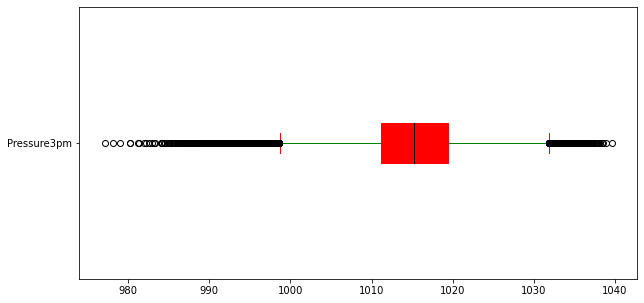

In [149]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Pressure3pm.plot.box(color=props2, patch_artist = True, vert = False)

In [150]:
IQR=df.Pressure3pm.quantile(0.75)-df.Pressure3pm.quantile(0.25)
LL=df.Pressure3pm.quantile(0.25)-(1.5*IQR)
UL=df.Pressure3pm.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

UL_LEN=len(df.Pressure3pm[df.Pressure3pm>UL])
print('Outliers above ul :',UL_LEN)
      
UpperLimit_perc=UL_LEN/len(df)
print('Upper limit OL: perc :',UpperLimit_perc)

LL_LEN=len(df.Pressure3pm[df.Pressure3pm<LL])
print('Outliers below ll :',LL_LEN)

LowerLimit_perc=LL_LEN/len(df)
print('Lower limit OL: perc :',LowerLimit_perc)

IQR:  8.299999999999955
LL:  998.6500000000001
UL:  1031.85
Outliers above ul : 1173
Upper limit OL: perc : 0.008064072597277603
Outliers below ll : 1351
Lower limit OL: perc : 0.009287776708373436


In [151]:
df.groupby("RainTomorrow")['Pressure3pm'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,1016.004237,6.363030,983.2,1012.0,1015.255889,1020.0,1039.6
Yes,31877.0,1012.589402,7.019494,977.1,1008.0,1013.200000,1016.6,1036.9


<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

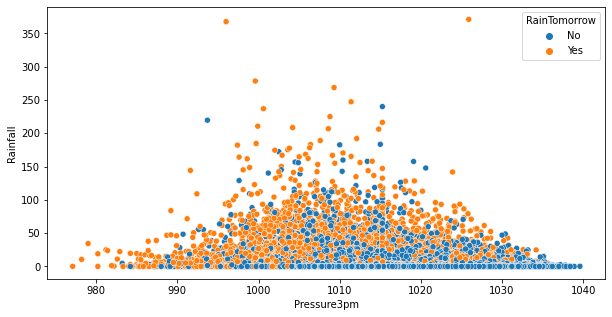

In [152]:
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

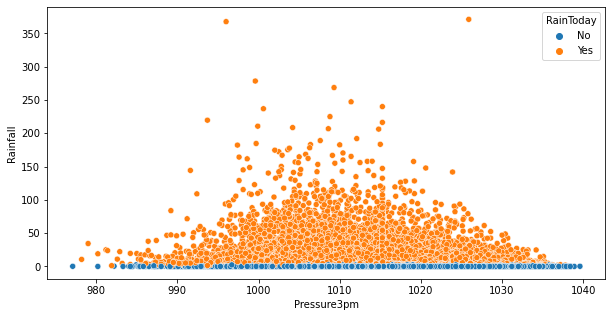

In [153]:
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Pressure3pm', ylabel='Humidity3pm'>

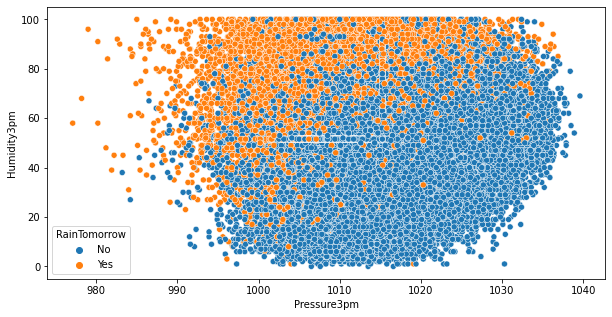

In [154]:
sns.scatterplot(x='Pressure3pm',y='Humidity3pm',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Pressure3pm', ylabel='Humidity3pm'>

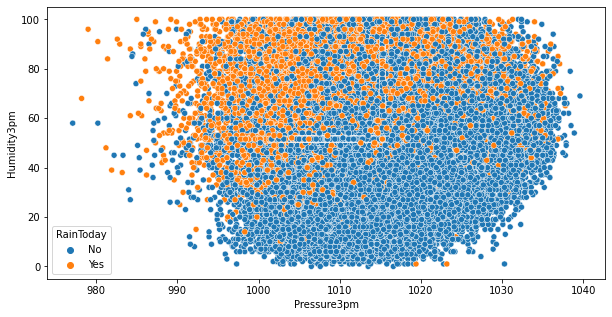

In [155]:
sns.scatterplot(x='Pressure3pm',y='Humidity3pm',data=df,hue='RainToday')

<function matplotlib.pyplot.show(close=None, block=None)>

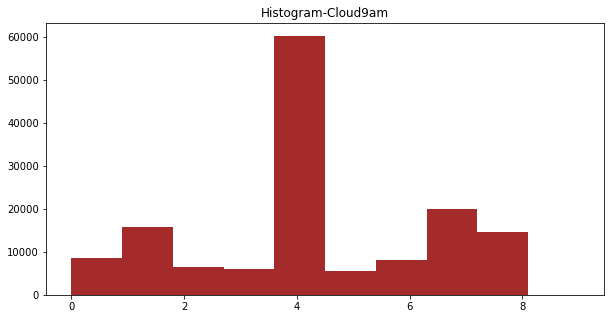

In [156]:
##Histogram
plt.hist(df.Cloud9am,color='brown')
plt.xlabel=("Cloud9am")
plt.title('Histogram-Cloud9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

In [160]:
df.groupby("Cloud9am")['RainTomorrow'].describe()

,count,unique,top,freq
Cloud9am,,,,
0.000000,8642,2,No,8409
1.000000,15687,2,No,14388
2.000000,6500,2,No,5593
3.000000,5914,2,No,4932
4.000000,4420,2,No,3542
4.447461,55888,2,No,44633
5.000000,5567,2,No,4338
6.000000,8171,2,No,6045
7.000000,19972,2,No,13550


<AxesSubplot:xlabel='Cloud9am', ylabel='Rainfall'>

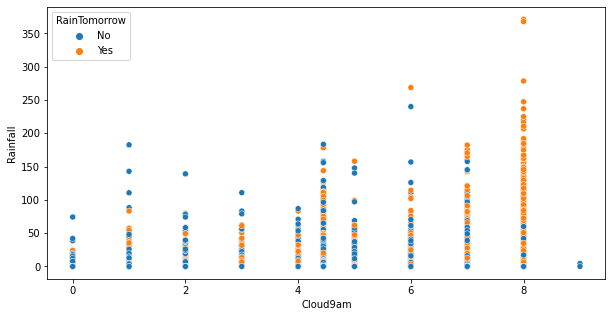

In [159]:
sns.scatterplot(x='Cloud9am',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Cloud9am', ylabel='Rainfall'>

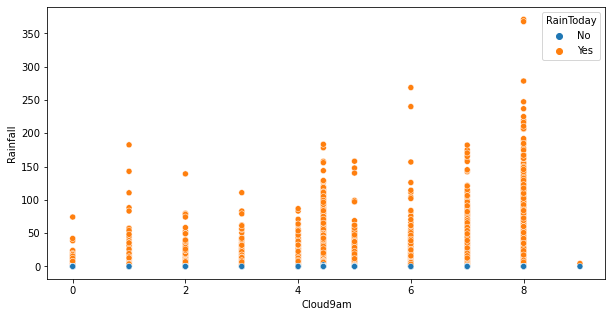

In [162]:
sns.scatterplot(x='Cloud9am',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Cloud9am', ylabel='count'>

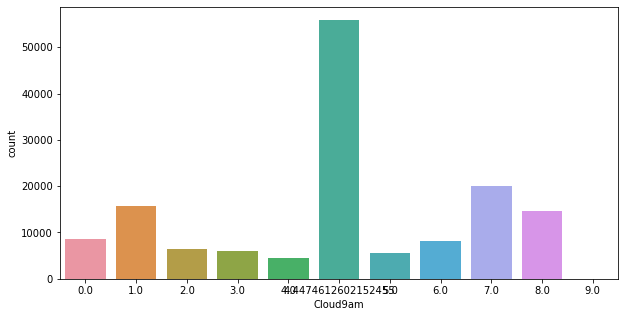

In [163]:
sns.countplot(df.Cloud9am)

In [161]:
df.Cloud9am.value_counts()

4.447461    55888
7.000000    19972
1.000000    15687
8.000000    14697
0.000000     8642
6.000000     8171
2.000000     6500
3.000000     5914
5.000000     5567
4.000000     4420
9.000000        2
Name: Cloud9am, dtype: int64

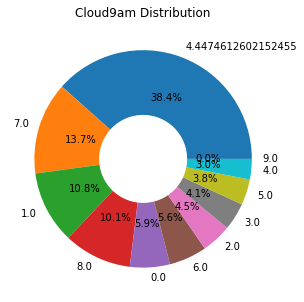

In [164]:
Frequency_by_Cloud9am=df["Cloud9am"].value_counts()
keys=Frequency_by_Cloud9am.keys().to_list()
counts=Frequency_by_Cloud9am.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("Cloud9am Distribution")
plt.show()
        

Text(0.5, 1.0, 'Cloud9am with RainTomorrow')

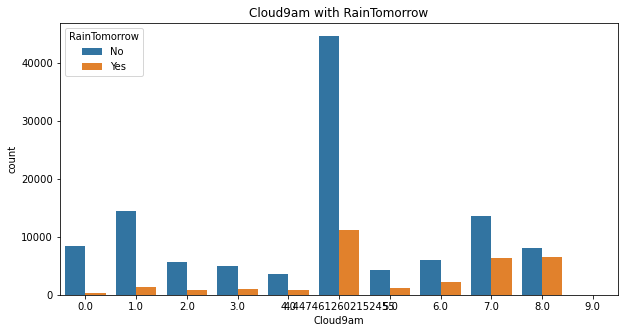

In [165]:
sns.countplot(x='Cloud9am',hue="RainTomorrow",data=df)
plt.xlabel=("Cloud9am")
plt.ylabel=("Counts")
plt.rcParams['figure.figsize'] = [10,8]
plt.title("Cloud9am with RainTomorrow")

In [167]:
df.Cloud3pm.value_counts()

4.50993    59358
7.00000    18229
1.00000    14976
8.00000    12660
6.00000     8978
2.00000     7226
3.00000     6921
5.00000     6815
4.00000     5322
0.00000     4974
9.00000        1
Name: Cloud3pm, dtype: int64

<AxesSubplot:xlabel='Cloud3pm', ylabel='count'>

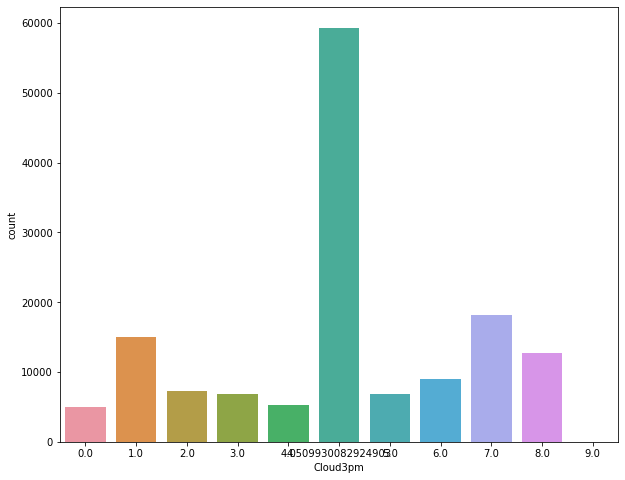

In [168]:
sns.countplot(df.Cloud3pm)

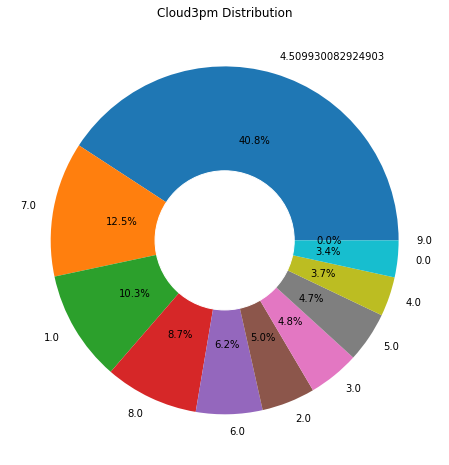

In [169]:
Frequency_by_Cloud3pm=df["Cloud3pm"].value_counts()
keys=Frequency_by_Cloud3pm.keys().to_list()
counts=Frequency_by_Cloud3pm.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("Cloud3pm Distribution")
plt.show()
        

Text(0.5, 1.0, 'Cloud3pm with RainTomorrow')

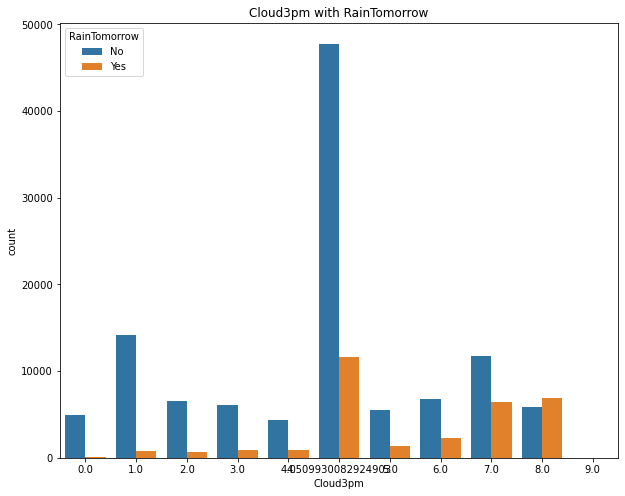

In [170]:
sns.countplot(x='Cloud3pm',hue="RainTomorrow",data=df)
plt.xlabel=("Cloud3pm")
plt.ylabel=("Counts")
plt.rcParams['figure.figsize'] = [10,8]
plt.title("Cloud3pm with RainTomorrow")

<function matplotlib.pyplot.show(close=None, block=None)>

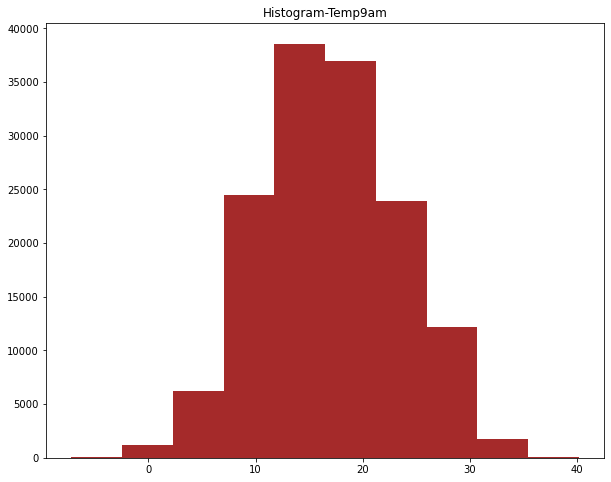

In [172]:
##Histogram
plt.hist(df.Temp9am,color='brown')
plt.xlabel=("Temp9am")
plt.title('Histogram-Temp9am')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

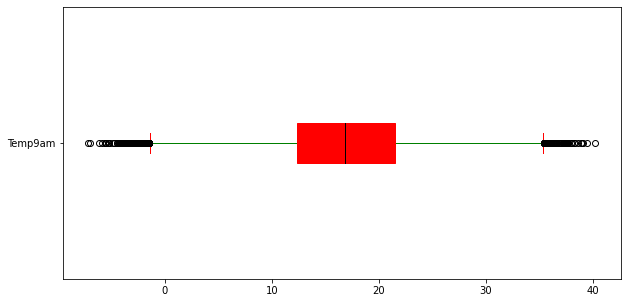

In [173]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Temp9am.plot.box(color=props2, patch_artist = True, vert = False)

In [174]:
IQR=df.Temp9am.quantile(0.75)-df.Temp9am.quantile(0.25)
LL=df.Temp9am.quantile(0.25)-(1.5*IQR)
UL=df.Temp9am.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

UL_LEN=len(df.Temp9am[df.Temp9am>UL])
print('Outliers above ul :',UL_LEN)
      
UpperLimit_perc=UL_LEN/len(df)
print('Upper limit OL: perc :',UpperLimit_perc)

LL_LEN=len(df.Temp9am[df.Temp9am<LL])
print('Outliers below ll :',LL_LEN)

LowerLimit_perc=LL_LEN/len(df)
print('Lower limit OL: perc :',LowerLimit_perc)

IQR:  9.2
LL:  -1.4999999999999982
UL:  35.3
Outliers above ul : 104
Upper limit OL: perc : 0.000714973188505431
Outliers below ll : 203
Lower limit OL: perc : 0.001395572666025024


<AxesSubplot:xlabel='Temp9am', ylabel='Rainfall'>

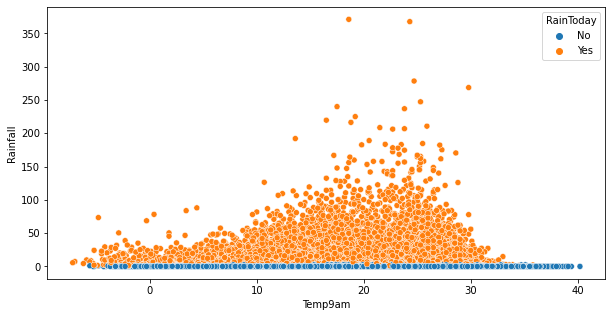

In [175]:
sns.scatterplot(x='Temp9am',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Temp9am', ylabel='Rainfall'>

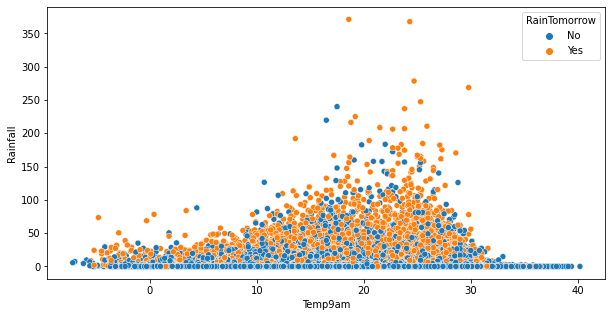

In [176]:
sns.scatterplot(x='Temp9am',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Temp9am', ylabel='MinTemp'>

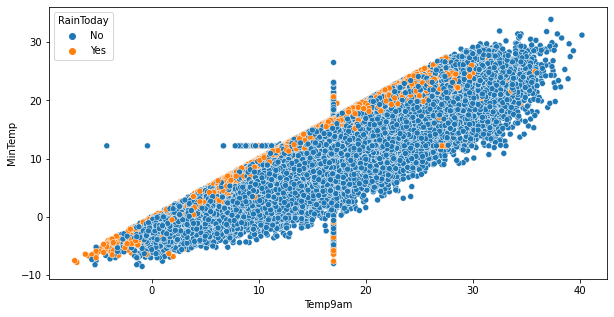

In [177]:
sns.scatterplot(x='Temp9am',y='MinTemp',data=df,hue='RainToday')

<AxesSubplot:xlabel='Temp9am', ylabel='MinTemp'>

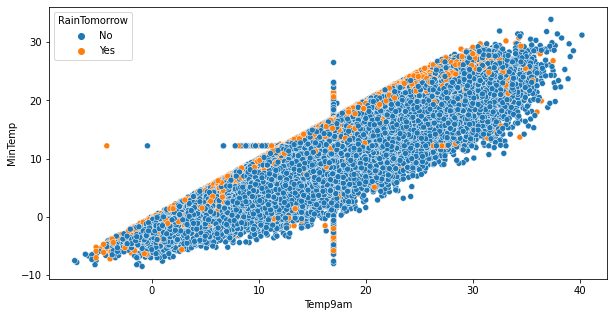

In [178]:
sns.scatterplot(x='Temp9am',y='MinTemp',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Temp9am', ylabel='MaxTemp'>

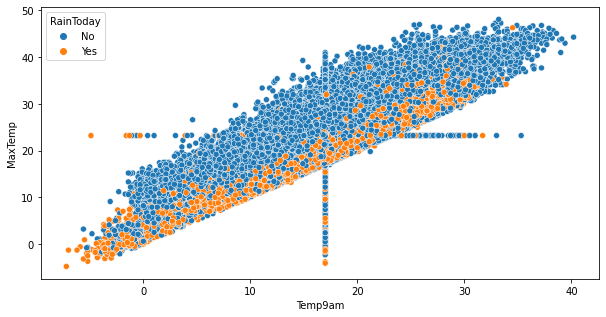

In [179]:
sns.scatterplot(x='Temp9am',y='MaxTemp',data=df,hue='RainToday')

<AxesSubplot:xlabel='Temp9am', ylabel='MaxTemp'>

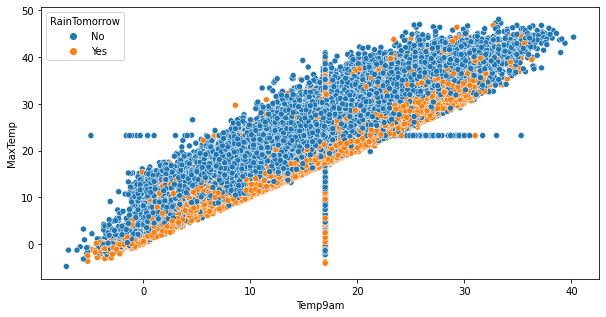

In [180]:
sns.scatterplot(x='Temp9am',y='MaxTemp',data=df,hue='RainTomorrow')

In [182]:
df.groupby("RainTomorrow")['Temp9am'].describe()

,count,mean,std,min,25%,50%,75%,max
RainTomorrow,,,,,,,,
No,113583.0,17.077941,6.474597,-7.2,12.5,16.990631,21.6,40.2
Yes,31877.0,16.679534,6.348323,-5.5,11.9,16.200000,21.1,37.5


<function matplotlib.pyplot.show(close=None, block=None)>

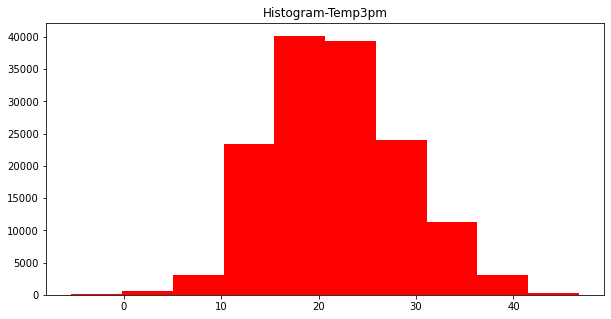

In [183]:
##Histogram
plt.hist(df.Temp3pm,color='red')
plt.xlabel=("Temp3pm")
plt.title('Histogram-Temp3pm')
plt.rcParams['figure.figsize'] = [10,5]
plt.show

<AxesSubplot:>

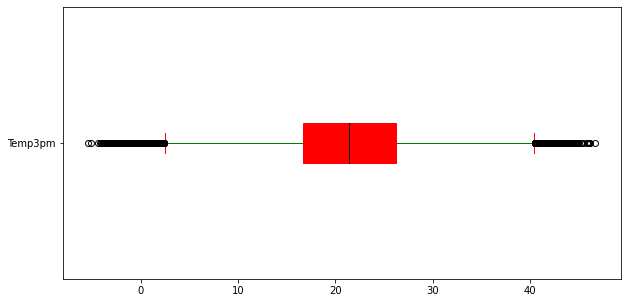

In [184]:
props2 = dict(boxes = 'red', whiskers = 'green', medians = 'black', caps = 'red')
df.Temp3pm.plot.box(color=props2, patch_artist = True, vert = False)

In [185]:
IQR=df.Temp3pm.quantile(0.75)-df.Temp3pm.quantile(0.25)
LL=df.Temp3pm.quantile(0.25)-(1.5*IQR)
UL=df.Temp3pm.quantile(0.75)+(1.5*IQR)

print("IQR: ",IQR)
print("LL: ",LL)
print("UL: ",UL)

UL_LEN=len(df.Temp3pm[df.Temp3pm>UL])
print('Outliers above ul :',UL_LEN)
      
UpperLimit_perc=UL_LEN/len(df)
print('Upper limit OL: perc :',UpperLimit_perc)

LL_LEN=len(df.Temp3pm[df.Temp3pm<LL])
print('Outliers below ll :',LL_LEN)

LowerLimit_perc=LL_LEN/len(df)
print('Lower limit OL: perc :',LowerLimit_perc)

IQR:  9.5
LL:  2.4499999999999993
UL:  40.45
Outliers above ul : 536
Upper limit OL: perc : 0.003684861817681837
Outliers below ll : 452
Lower limit OL: perc : 0.003107383473119758


<AxesSubplot:xlabel='Temp3pm', ylabel='Rainfall'>

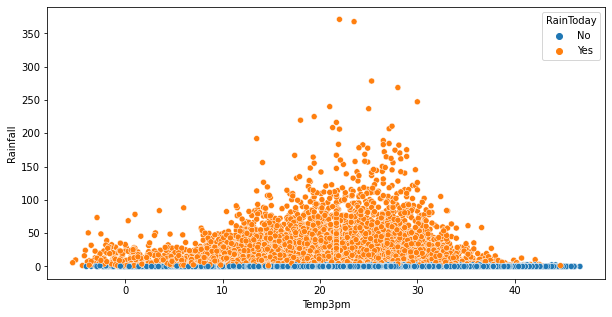

In [186]:
sns.scatterplot(x='Temp3pm',y='Rainfall',data=df,hue='RainToday')

<AxesSubplot:xlabel='Temp3pm', ylabel='Rainfall'>

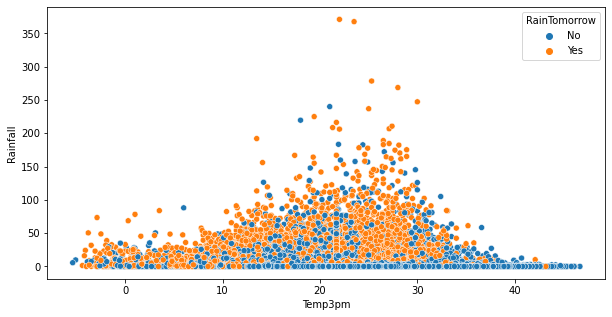

In [187]:
sns.scatterplot(x='Temp3pm',y='Rainfall',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Temp3pm', ylabel='MinTemp'>

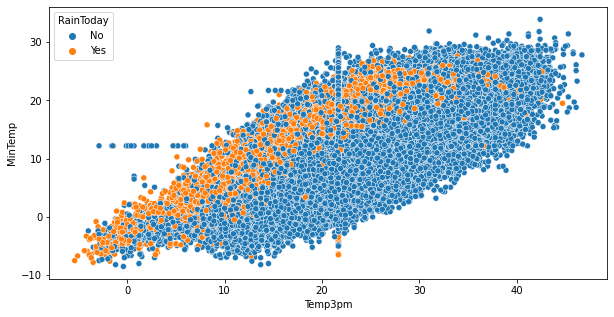

In [188]:
sns.scatterplot(x='Temp3pm',y='MinTemp',data=df,hue='RainToday')

<AxesSubplot:xlabel='Temp3pm', ylabel='MinTemp'>

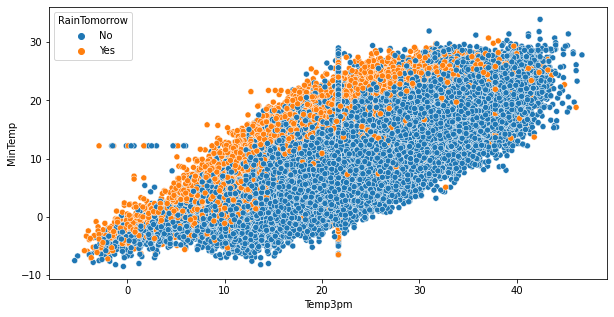

In [192]:
sns.scatterplot(x='Temp3pm',y='MinTemp',data=df,hue='RainTomorrow')

<AxesSubplot:xlabel='Temp3pm', ylabel='MaxTemp'>

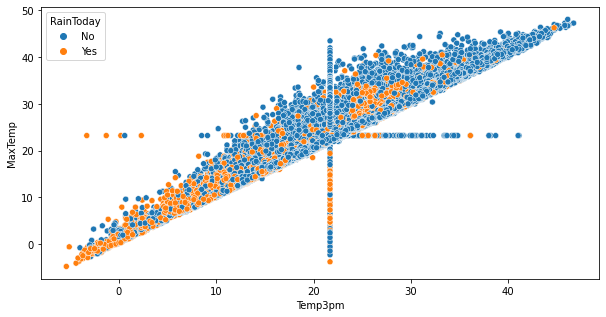

In [191]:
sns.scatterplot(x='Temp3pm',y='MaxTemp',data=df,hue='RainToday')

<AxesSubplot:xlabel='Temp3pm', ylabel='MaxTemp'>

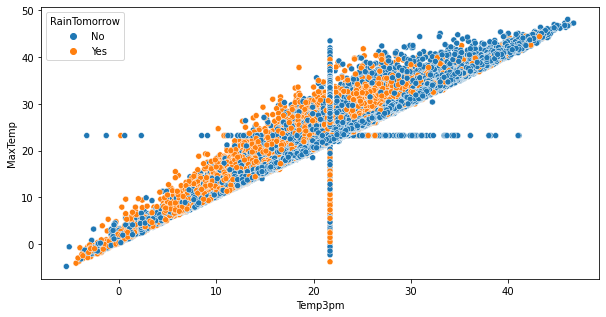

In [193]:
sns.scatterplot(x='Temp3pm',y='MaxTemp',data=df,hue='RainTomorrow')

In [194]:
df.RainToday.value_counts()

No     113580
Yes     31880
Name: RainToday, dtype: int64

<AxesSubplot:xlabel='RainToday', ylabel='count'>

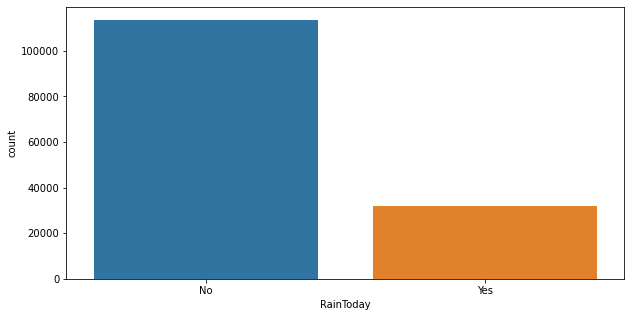

In [195]:
sns.countplot(df.RainToday)

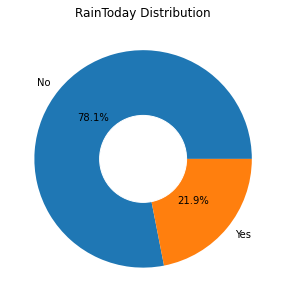

In [196]:
Frequency_by_RainToday=df["RainToday"].value_counts()
keys=Frequency_by_RainToday.keys().to_list()
counts=Frequency_by_RainToday.to_list()
plt.pie(x=counts,labels=keys,autopct="%1.1f%%")
circle=plt.Circle(xy=(0,0),radius=0.4,color="white")
plt.gcf()
plt.gca().add_artist(circle)
plt.title("RainToday Distribution")
plt.show()
        

Text(0.5, 1.0, 'RainToday with RainTomorrow')

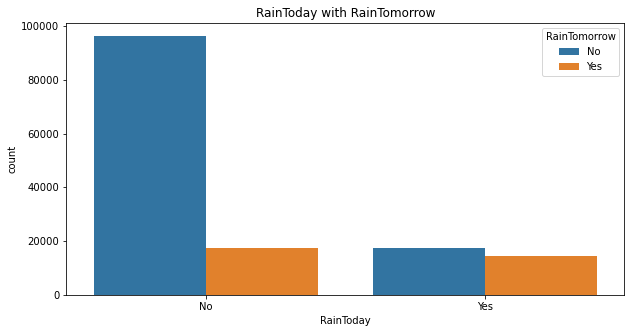

In [197]:
sns.countplot(x='RainToday',hue="RainTomorrow",data=df)
plt.xlabel=("RainToday")
plt.ylabel=("Counts")
plt.rcParams['figure.figsize'] = [10,8]
plt.title("RainToday with RainTomorrow")

In [199]:
numeric_features=df.select_dtypes(np.number)
categorical_features=df.select_dtypes("object")

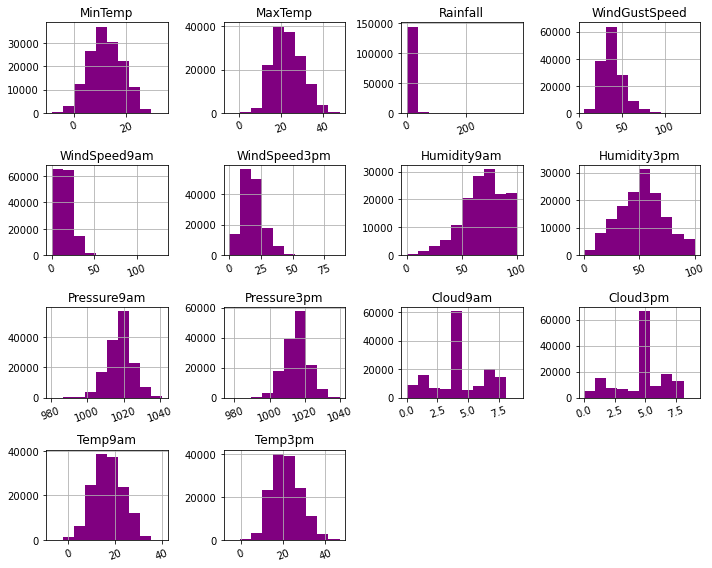

In [201]:
numeric_features.hist(xrot = 20, color = "purple")

# adjust the subplots
plt.tight_layout()

# display the plot
plt.show()  

In [205]:
numeric_features.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'],
      dtype='object')

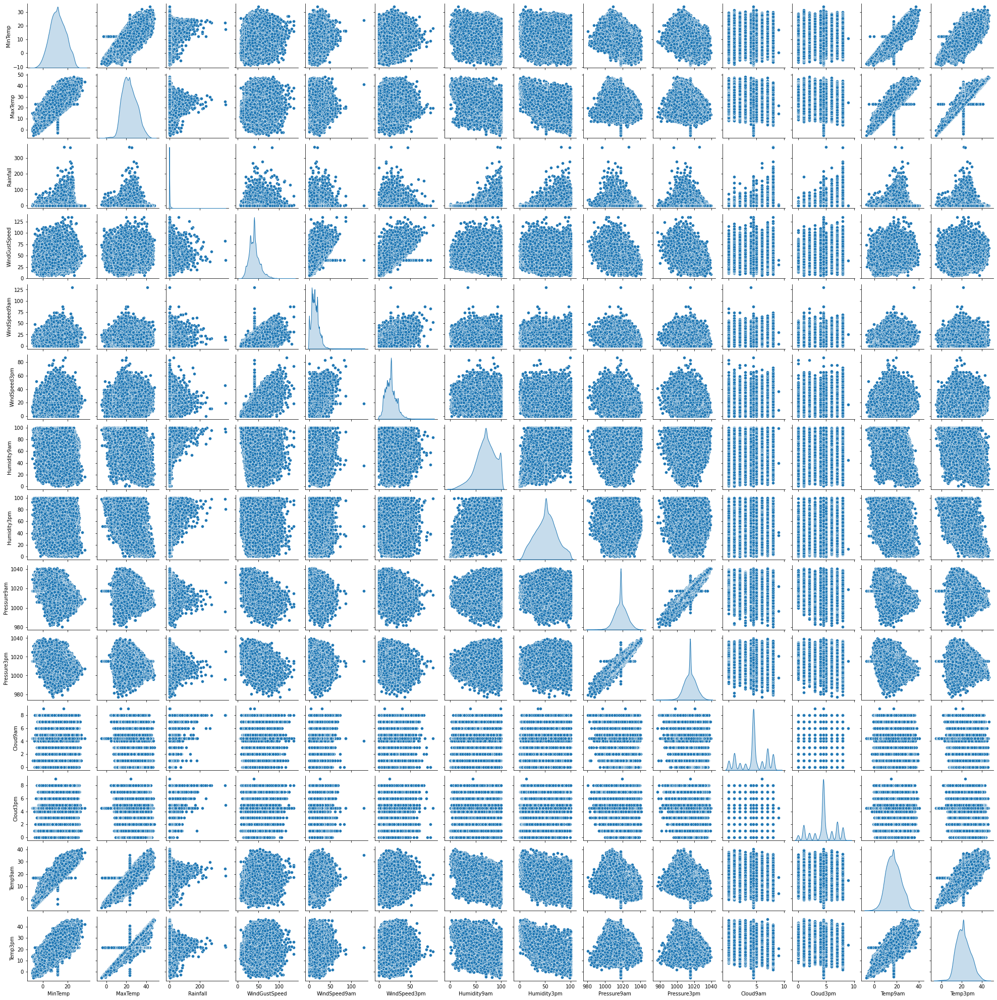

In [206]:
# Pairplot of numeric variables

# select the columns for the pairplot
columns= ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
sns.pairplot(df[columns], size=2, kind= "scatter", diag_kind="kde")

# display the plot
plt.show()

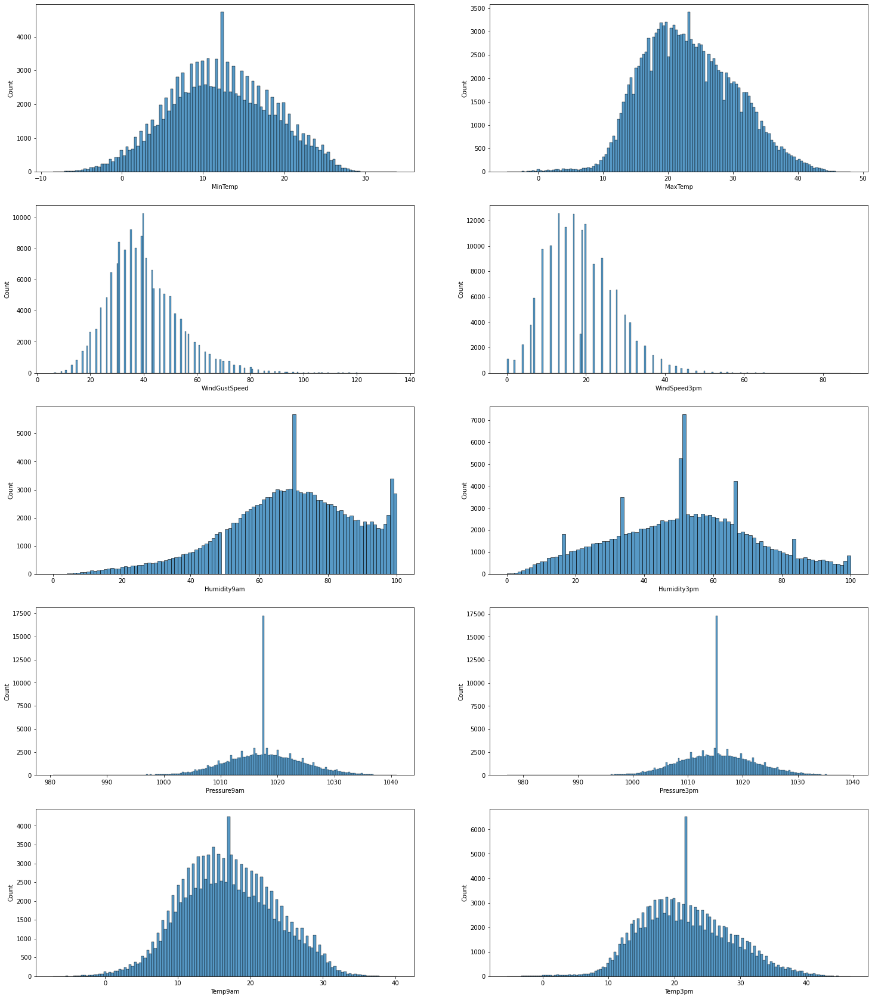

In [391]:
plt.figure(figsize=(25,30))
plt.subplot(5,2,1)
sns.histplot(df,x='MinTemp')
plt.subplot(5,2,2)
sns.histplot(df,x='MaxTemp')
plt.subplot(5,2,3)
sns.histplot(df,x='WindGustSpeed')
plt.subplot(5,2,4)
sns.histplot(df,x='WindSpeed3pm')
plt.subplot(5,2,5)
sns.histplot(df,x='Humidity9am')
plt.subplot(5,2,6)
sns.histplot(df,x='Humidity3pm')
plt.subplot(5,2,7)
sns.histplot(df,x='Pressure9am')
plt.subplot(5,2,8)
sns.histplot(df,x='Pressure3pm')
plt.subplot(5,2,9)
sns.histplot(df,x='Temp9am')
plt.subplot(5,2,10)
sns.histplot(df,x='Temp3pm')
plt.show()

In [208]:
cormat=df.corr()
cormat

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.733400,0.102706,0.172553,0.173530,0.173058,-0.231290,0.005995,-0.423584,-0.433147,0.062151,0.016722,0.897692,0.699211
MaxTemp,0.733400,1.000000,-0.074040,0.065895,0.014458,0.049717,-0.498286,-0.498760,-0.308309,-0.396622,-0.225315,-0.212760,0.879170,0.968713
Rainfall,0.102706,-0.074040,1.000000,0.126446,0.085848,0.056527,0.221457,0.248905,-0.159055,-0.119541,0.171144,0.145343,0.011069,-0.077684
WindGustSpeed,0.172553,0.065895,0.126446,1.000000,0.577247,0.657243,-0.207863,-0.025355,-0.425760,-0.383938,0.052417,0.079927,0.145904,0.031884
WindSpeed9am,0.173530,0.014458,0.085848,0.577247,1.000000,0.512453,-0.268196,-0.031005,-0.215334,-0.165383,0.019728,0.041651,0.127560,0.004592
WindSpeed3pm,0.173058,0.049717,0.056527,0.657243,0.512453,1.000000,-0.143512,0.016275,-0.277604,-0.239659,0.041611,0.019813,0.161060,0.027587
Humidity9am,-0.231290,-0.498286,0.221457,-0.207863,-0.268196,-0.143512,1.000000,0.659219,0.131561,0.176076,0.353477,0.273302,-0.469748,-0.490974
Humidity3pm,0.005995,-0.498760,0.248905,-0.025355,-0.031005,0.016275,0.659219,1.000000,-0.025848,0.048695,0.398762,0.406605,-0.216964,-0.555608
Pressure9am,-0.423584,-0.308309,-0.159055,-0.425760,-0.215334,-0.277604,0.131561,-0.025848,1.000000,0.959662,-0.101611,-0.114425,-0.397131,-0.265532
Pressure3pm,-0.433147,-0.396622,-0.119541,-0.383938,-0.165383,-0.239659,0.176076,0.048695,0.959662,1.000000,-0.047718,-0.065929,-0.441459,-0.360707


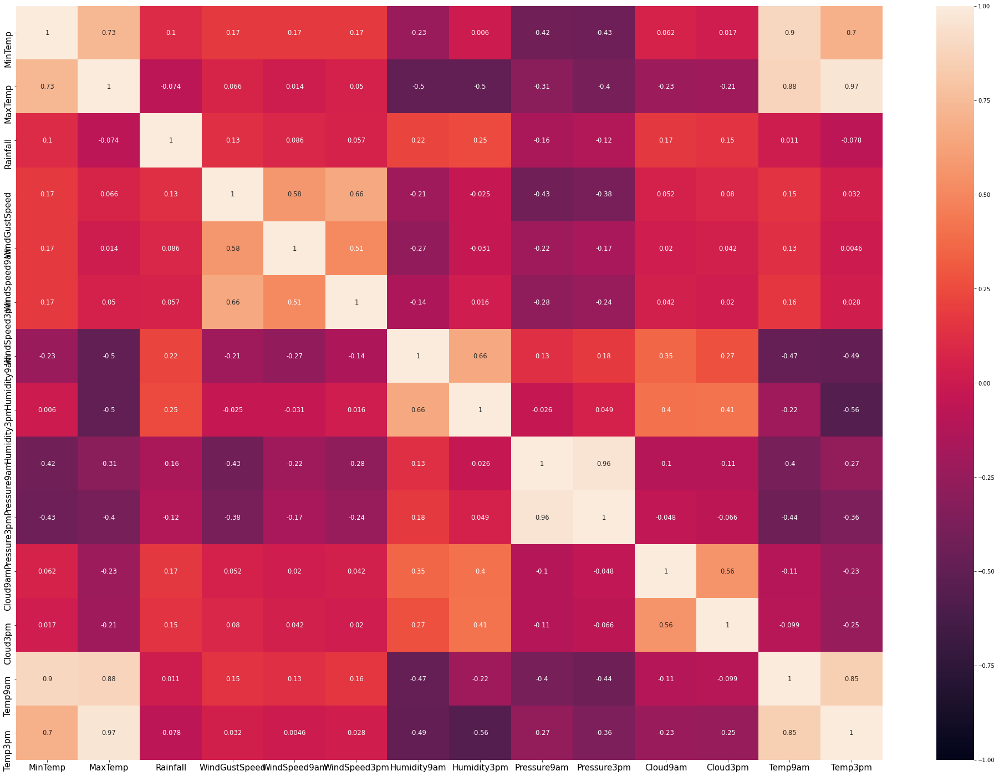

In [211]:
plt.figure(figsize = (35,25))

sns.heatmap(cormat, annot = True, vmax = 1.0, vmin = -1.0,  annot_kws = {"size": 11.5})

# set the size of x and y axes labels using 'fontsize'
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# display the plot
plt.show()

In [213]:
numeric_features.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'],
      dtype='object')

In [216]:
from scipy import stats

In [221]:
df.RainTomorrow.value_counts()

No     113583
Yes     31877
Name: RainTomorrow, dtype: int64

In [222]:
Rain_n = df[df.RainTomorrow == 'No']
Rain_y = df[df.RainTomorrow == 'Yes']

In [223]:
stats.ttest_ind(Rain_n.MinTemp, Rain_y.MinTemp, equal_var=True)


Ttest_indResult(statistic=-31.446297781396925, pvalue=2.5217334960903784e-216)

In [224]:
stats.ttest_ind(Rain_n.MaxTemp, Rain_y.MaxTemp, equal_var=True)


Ttest_indResult(statistic=60.57092305741387, pvalue=0.0)

In [225]:
stats.ttest_ind(Rain_n.Rainfall, Rain_y.Rainfall, equal_var=True)


Ttest_indResult(statistic=-91.75206315961427, pvalue=0.0)

In [226]:
stats.ttest_ind(Rain_n.WindGustSpeed, Rain_y.WindGustSpeed, equal_var=True)

Ttest_indResult(statistic=-86.19465925133089, pvalue=0.0)

In [227]:
stats.ttest_ind(Rain_n.WindSpeed9am, Rain_y.WindSpeed9am, equal_var=True)

Ttest_indResult(statistic=-33.20925677629025, pvalue=6.35873513611051e-241)

In [228]:
stats.ttest_ind(Rain_n.WindSpeed3pm, Rain_y.WindSpeed3pm, equal_var=True)

Ttest_indResult(statistic=-32.2301909347134, pvalue=4.237384064468734e-227)

In [229]:
stats.ttest_ind(Rain_n.Humidity9am, Rain_y.Humidity9am, equal_var=True)

Ttest_indResult(statistic=-99.06906846387406, pvalue=0.0)

In [230]:
stats.ttest_ind(Rain_n.Humidity3pm, Rain_y.Humidity3pm, equal_var=True)

Ttest_indResult(statistic=-183.30039453989642, pvalue=0.0)

In [231]:
stats.ttest_ind(Rain_n.Pressure9am, Rain_y.Pressure9am, equal_var=True)

Ttest_indResult(statistic=90.53980090750034, pvalue=0.0)

In [234]:
stats.ttest_ind(Rain_n.Pressure3pm, Rain_y.Pressure3pm, equal_var=True)

Ttest_indResult(statistic=82.7259817816368, pvalue=0.0)

In [235]:
stats.ttest_ind(Rain_n.Cloud9am, Rain_y.Cloud9am, equal_var=True)

Ttest_indResult(statistic=-98.46514429090783, pvalue=0.0)

In [236]:
stats.ttest_ind(Rain_n.Cloud3pm, Rain_y.Cloud3pm, equal_var=True)

Ttest_indResult(statistic=-119.08553133160731, pvalue=0.0)

In [238]:
stats.ttest_ind(Rain_n.Temp3pm, Rain_y.Temp3pm, equal_var=True)

Ttest_indResult(statistic=72.92503226544497, pvalue=0.0)

In [240]:
categorical_features.columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [242]:
from scipy.stats import chi2_contingency

In [243]:
for i in categorical_features.columns:
    if i != 'RainTomorrow':
        cross_tab=pd.crosstab(index=df[i],columns=df['RainTomorrow'])
        chi_square=chi2_contingency(cross_tab)
        print('P-value for ',i,' : ',chi_square[1])
        alpha=0.05
        if chi_square[1]<alpha:
            print(i,' column will be a good predictor\n')
        else:
            print(i,' column will be a bad predictor\n')

P-value for  Location  :  0.0
Location  column will be a good predictor

P-value for  WindGustDir  :  3.3006356898942715e-235
WindGustDir  column will be a good predictor

P-value for  WindDir9am  :  1.9700503720305214e-33
WindDir9am  column will be a good predictor

P-value for  WindDir3pm  :  0.23828521405853897
WindDir3pm  column will be a bad predictor

P-value for  RainToday  :  0.0
RainToday  column will be a good predictor



In [ ]:
Date,MaxTemp,WindDir3pm,

In [246]:
df2=df.copy()

In [247]:
df2=df2.drop(["Date",'Location','MaxTemp','WindDir3pm','WindSpeed3pm','Humidity3pm','Pressure3pm','Cloud3pm'],axis=1)

In [248]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145460 entries, 0 to 145459
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   MinTemp        145460 non-null  float64
 1   Rainfall       145460 non-null  float64
 2   WindGustDir    145460 non-null  object 
 3   WindGustSpeed  145460 non-null  float64
 4   WindDir9am     145460 non-null  object 
 5   WindSpeed9am   145460 non-null  float64
 6   Humidity9am    145460 non-null  float64
 7   Pressure9am    145460 non-null  float64
 8   Cloud9am       145460 non-null  float64
 9   Temp9am        145460 non-null  float64
 10  Temp3pm        145460 non-null  float64
 11  RainToday      145460 non-null  object 
 12  RainTomorrow   145460 non-null  object 
dtypes: float64(9), object(4)
memory usage: 20.5+ MB


In [250]:
categorical_features=df2.select_dtypes('object')

In [252]:
from sklearn.preprocessing import LabelEncoder

In [253]:
for i in categorical_features:
    label=LabelEncoder()
    df2[i]=label.fit_transform(df2[i])

In [254]:
df2.head()

,MinTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,Humidity9am,Pressure9am,Cloud9am,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,0.6,3,44.0,2,20.0,71.0,1007.7,8.000000,16.9,21.8,0,0
1,7.4,0.0,7,44.0,1,4.0,44.0,1010.6,4.447461,17.2,24.3,0,0
2,12.9,0.0,3,46.0,2,19.0,38.0,1007.6,4.447461,21.0,23.2,0,0
3,9.2,0.0,1,24.0,1,11.0,45.0,1017.6,4.447461,18.1,26.5,0,0
4,17.5,1.0,3,41.0,0,7.0,82.0,1010.8,7.000000,17.8,29.7,0,0


In [256]:
df2.RainTomorrow.value_counts()

0    113583
1     31877
Name: RainTomorrow, dtype: int64

In [257]:
RainTomorrow_n = df2[df2.RainTomorrow == 0]
len(RainTomorrow_n)

113583

In [258]:
RainTomorrow_y = df2[df2.RainTomorrow == 1]
len(RainTomorrow_y)

31877

In [259]:
from sklearn.utils import resample
RainTomorrow_upsampled1 = resample(RainTomorrow_y,
                          replace=True, # sample with replacement
                          n_samples=len(RainTomorrow_n), 
                          random_state=27) # reproducible results
RainTomorrow_upsampled1

,MinTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,Humidity9am,Pressure9am,Cloud9am,Temp9am,Temp3pm,RainToday,RainTomorrow
23617,22.6,0.0,1,28.0,0,15.0,79.0,1014.8,7.000000,25.4,25.9,0,1
89693,24.5,0.4,1,30.0,0,7.0,72.0,1009.9,6.000000,29.2,29.9,0,1
19366,9.3,12.2,4,57.0,2,13.0,82.0,1030.4,4.447461,10.7,14.0,1,1
67994,7.3,0.0,1,30.0,2,7.0,73.0,1021.9,6.000000,9.0,15.8,0,1
22622,16.6,0.0,5,48.0,0,24.0,55.0,1024.3,4.000000,18.9,18.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100990,13.4,0.6,4,70.0,2,9.0,93.0,1017.7,8.000000,15.9,16.6,0,1
100007,11.0,2.6,1,37.0,0,7.0,96.0,1014.2,8.000000,13.0,16.0,1,1
97371,10.8,3.0,4,48.0,2,17.0,53.0,1018.1,4.447461,14.1,14.3,1,1
4384,14.7,0.0,1,28.0,0,6.0,94.0,1019.3,4.447461,15.7,16.4,0,1


In [260]:
df_Rainfall = pd.concat([RainTomorrow_n, RainTomorrow_upsampled1]) 
df_Rainfall

,MinTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,Humidity9am,Pressure9am,Cloud9am,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,0.6,3,44.0,2,20.0,71.0,1007.7,8.000000,16.9,21.8,0,0
1,7.4,0.0,7,44.0,1,4.0,44.0,1010.6,4.447461,17.2,24.3,0,0
2,12.9,0.0,3,46.0,2,19.0,38.0,1007.6,4.447461,21.0,23.2,0,0
3,9.2,0.0,1,24.0,1,11.0,45.0,1017.6,4.447461,18.1,26.5,0,0
4,17.5,1.0,3,41.0,0,7.0,82.0,1010.8,7.000000,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100990,13.4,0.6,4,70.0,2,9.0,93.0,1017.7,8.000000,15.9,16.6,0,1
100007,11.0,2.6,1,37.0,0,7.0,96.0,1014.2,8.000000,13.0,16.0,1,1
97371,10.8,3.0,4,48.0,2,17.0,53.0,1018.1,4.447461,14.1,14.3,1,1
4384,14.7,0.0,1,28.0,0,6.0,94.0,1019.3,4.447461,15.7,16.4,0,1


In [262]:
df_Rainfall.RainTomorrow.value_counts()

1    113583
0    113583
Name: RainTomorrow, dtype: int64

In [265]:
x=df_Rainfall.drop(["RainTomorrow"],axis=1)
y=df_Rainfall["RainTomorrow"]

In [266]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.25,random_state=0)

In [267]:
print("xtrain :",xtrain.shape)
print("xtest :",xtest.shape)
print("ytrain :",ytrain.shape)
print("ytest :",ytest.shape)

xtrain : (170374, 12)
xtest : (56792, 12)
ytrain : (170374,)
ytest : (56792,)


In [268]:
lr=LogisticRegression()
lrmodel=lr.fit(xtrain,ytrain)

In [269]:
Logiestic_pred=lrmodel.predict(xtest)
Logiestic_pred

array([1, 1, 1, ..., 1, 0, 0])

In [270]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

In [271]:
confusion_matrix(ytest,Logiestic_pred)

array([[21016,  7426],
       [ 7361, 20989]], dtype=int64)

In [272]:
print(classification_report(ytest,Logiestic_pred))

              precision    recall  f1-score   support

           0       0.74      0.74      0.74     28442
           1       0.74      0.74      0.74     28350

    accuracy                           0.74     56792
   macro avg       0.74      0.74      0.74     56792
weighted avg       0.74      0.74      0.74     56792



In [278]:
acc_lr=accuracy_score(ytest,Logiestic_pred)*100
acc_lr=round(acc_lr,2)
acc_lr

73.96

In [281]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
fpr, tpr, thresholds =roc_curve(ytest, Logiestic_pred)
roc_auc = auc(fpr, tpr) 
print(roc_auc)

0.7396299917639252


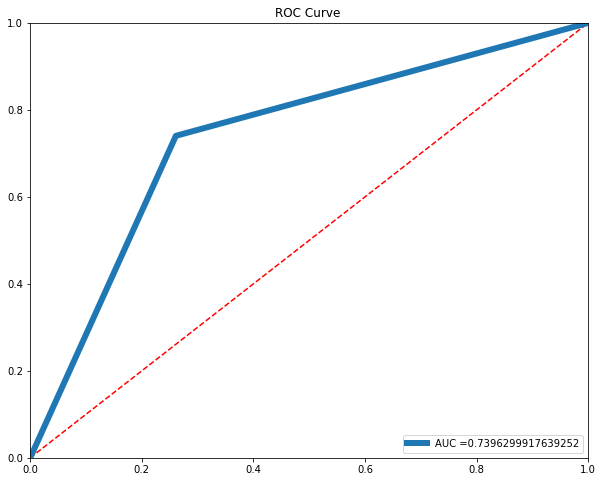

In [283]:
plt.title('ROC Curve ')
plt.xlabel=('False Positive Rate (1-Specificity)')
plt.ylabel=('True Positive Rate (Sensitivity)')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.plot(fpr, tpr, label = 'AUC =' + str(roc_auc), lw=6)
plt.legend(loc=4) #Location of label
plt.show()

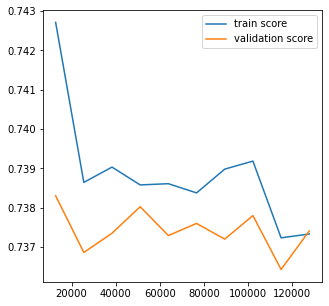

In [279]:
 N, train_score, test_score = learning_curve(lrmodel, xtrain, ytrain, 
                                               cv=4, scoring='f1', 
                                               train_sizes=np.linspace(0.1,1,10))
plt.figure(figsize=(5,5))
plt.plot(N, train_score.mean(axis=1), label='train score')
plt.plot(N, test_score.mean(axis=1), label='validation score')
plt.legend()
plt.show()


In [274]:
from sklearn.tree import DecisionTreeClassifier

In [275]:
dtc=DecisionTreeClassifier()
dtcmodel=dtc.fit(xtrain,ytrain)


In [276]:
Tree_pred=dtcmodel.predict(xtest)
Tree_pred

array([0, 1, 1, ..., 0, 1, 0])

In [284]:
confusion_matrix(ytest,Tree_pred)

array([[23236,  5206],
       [ 1042, 27308]], dtype=int64)

In [277]:
print(classification_report(ytest,Tree_pred))

              precision    recall  f1-score   support

           0       0.96      0.82      0.88     28442
           1       0.84      0.96      0.90     28350

    accuracy                           0.89     56792
   macro avg       0.90      0.89      0.89     56792
weighted avg       0.90      0.89      0.89     56792



In [332]:
acc_dtc=accuracy_score(ytest,Tree_pred)*100
acc_dtc=round(acc_dtc,2)
acc_dtc

89.0

In [285]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
fpr, tpr, thresholds =roc_curve(ytest, Tree_pred)
roc_auc = auc(fpr, tpr) 
print(roc_auc)

0.8901029912416828


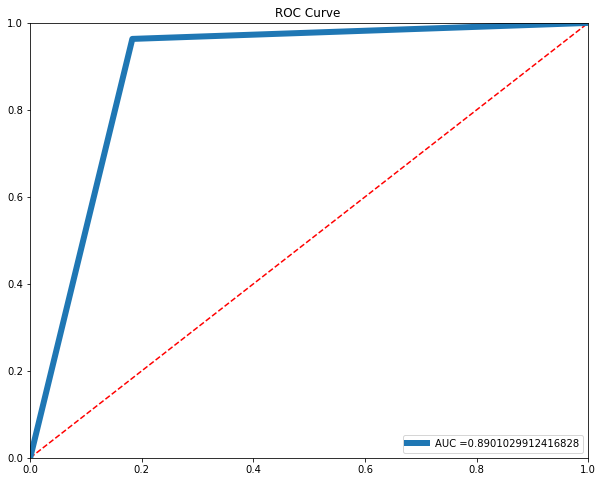

In [286]:
plt.title('ROC Curve ')
plt.xlabel=('False Positive Rate (1-Specificity)')
plt.ylabel=('True Positive Rate (Sensitivity)')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.plot(fpr, tpr, label = 'AUC =' + str(roc_auc), lw=6)
plt.legend(loc=4) #Location of label
plt.show()

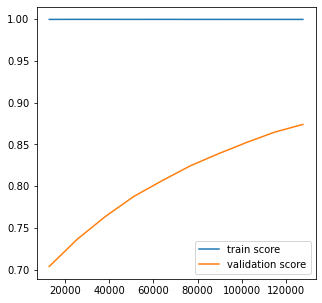

In [287]:
 N, train_score, test_score = learning_curve(dtcmodel, xtrain, ytrain, 
                                               cv=4, scoring='f1', 
                                               train_sizes=np.linspace(0.1,1,10))
plt.figure(figsize=(5,5))
plt.plot(N, train_score.mean(axis=1), label='train score')
plt.plot(N, test_score.mean(axis=1), label='validation score')
plt.legend()
plt.show()


In [289]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=150)
model.fit(xtrain,ytrain)

RandomForestClassifier(n_estimators=150)

In [290]:
RF_pred=model.predict(xtest)

In [291]:
confusion_matrix(ytest,RF_pred)

array([[25511,  2931],
       [  915, 27435]], dtype=int64)

In [292]:
print(classification_report(ytest,RF_pred))

              precision    recall  f1-score   support

           0       0.97      0.90      0.93     28442
           1       0.90      0.97      0.93     28350

    accuracy                           0.93     56792
   macro avg       0.93      0.93      0.93     56792
weighted avg       0.93      0.93      0.93     56792



In [293]:
acc_RF=accuracy_score(ytest,RF_pred)*100
acc_RF=round(acc_RF,2)
acc_RF

93.23

In [294]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
fpr, tpr, thresholds =roc_curve(ytest, RF_pred)
roc_auc = auc(fpr, tpr) 
print(roc_auc)

0.9323365214793383


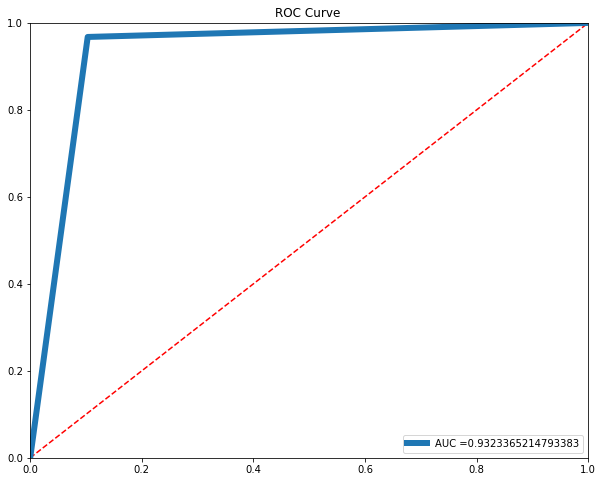

In [295]:
plt.title('ROC Curve ')
plt.xlabel=('False Positive Rate (1-Specificity)')
plt.ylabel=('True Positive Rate (Sensitivity)')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.plot(fpr, tpr, label = 'AUC =' + str(roc_auc), lw=6)
plt.legend(loc=4) #Location of label
plt.show()

In [297]:
knn=KNeighborsClassifier(n_neighbors=4)
knnmodel=knn.fit(xtrain,ytrain)

In [298]:
knn_pred=knnmodel.predict(xtest)
knn_pred

array([0, 1, 1, ..., 1, 0, 0])

In [299]:
print(classification_report(ytest,knn_pred))

              precision    recall  f1-score   support

           0       0.81      0.79      0.80     28442
           1       0.80      0.82      0.81     28350

    accuracy                           0.81     56792
   macro avg       0.81      0.81      0.81     56792
weighted avg       0.81      0.81      0.81     56792



In [300]:
acc_knn=accuracy_score(ytest,knn_pred)*100
acc_knn=round(acc_knn,2)
acc_knn

80.53

In [301]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
fpr, tpr, thresholds =roc_curve(ytest, RF_pred)
roc_auc = auc(fpr, tpr) 
print(roc_auc)

0.9323365214793383


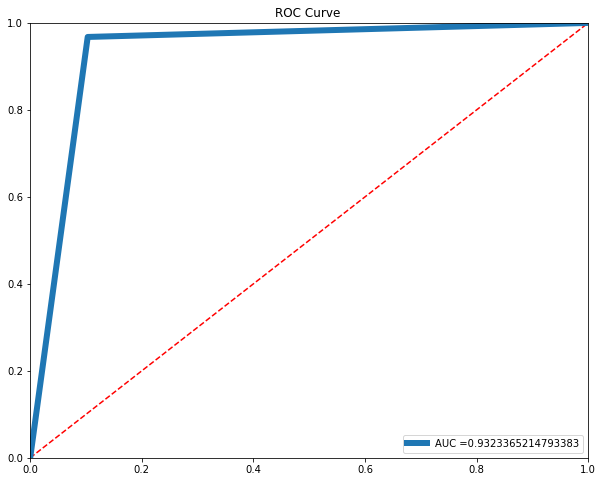

In [302]:
plt.title('ROC Curve ')
plt.xlabel=('False Positive Rate (1-Specificity)')
plt.ylabel=('True Positive Rate (Sensitivity)')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.plot(fpr, tpr, label = 'AUC =' + str(roc_auc), lw=6)
plt.legend(loc=4) #Location of label
plt.show()

# PCA

In [303]:
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA

In [305]:
X=df_Rainfall.drop('RainTomorrow',axis=1)
X

,MinTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,Humidity9am,Pressure9am,Cloud9am,Temp9am,Temp3pm,RainToday
0,13.4,0.6,3,44.0,2,20.0,71.0,1007.7,8.000000,16.9,21.8,0
1,7.4,0.0,7,44.0,1,4.0,44.0,1010.6,4.447461,17.2,24.3,0
2,12.9,0.0,3,46.0,2,19.0,38.0,1007.6,4.447461,21.0,23.2,0
3,9.2,0.0,1,24.0,1,11.0,45.0,1017.6,4.447461,18.1,26.5,0
4,17.5,1.0,3,41.0,0,7.0,82.0,1010.8,7.000000,17.8,29.7,0
...,...,...,...,...,...,...,...,...,...,...,...,...
100990,13.4,0.6,4,70.0,2,9.0,93.0,1017.7,8.000000,15.9,16.6,0
100007,11.0,2.6,1,37.0,0,7.0,96.0,1014.2,8.000000,13.0,16.0,1
97371,10.8,3.0,4,48.0,2,17.0,53.0,1018.1,4.447461,14.1,14.3,1
4384,14.7,0.0,1,28.0,0,6.0,94.0,1019.3,4.447461,15.7,16.4,0


In [306]:
X=X.values
X

array([[13.4,  0.6,  3. , ..., 16.9, 21.8,  0. ],
       [ 7.4,  0. ,  7. , ..., 17.2, 24.3,  0. ],
       [12.9,  0. ,  3. , ..., 21. , 23.2,  0. ],
       ...,
       [10.8,  3. ,  4. , ..., 14.1, 14.3,  1. ],
       [14.7,  0. ,  1. , ..., 15.7, 16.4,  0. ],
       [12.5,  0. ,  6. , ..., 16.8, 23.4,  0. ]])

In [307]:
X=scale(X)
X

array([[ 0.13330636, -0.28561851, -0.10097978, ...,  0.00324772,
         0.14545987, -0.66628624],
       [-0.81104908, -0.3404281 ,  2.1068329 , ...,  0.05009622,
         0.51112061, -0.66628624],
       [ 0.05461007, -0.3404281 , -0.10097978, ...,  0.64351049,
         0.35022989, -0.66628624],
       ...,
       [-0.27591433, -0.06638016,  0.45097339, ..., -0.4340049 ,
        -0.95152234,  1.50085645],
       [ 0.33791671, -0.3404281 , -1.20488612, ..., -0.18414626,
        -0.64436732, -0.66628624],
       [-0.00834696, -0.3404281 ,  1.55487973, ..., -0.01236844,
         0.37948275, -0.66628624]])

In [308]:
pca=PCA(n_components=12)
pca.fit(X)

PCA(n_components=12)

In [309]:
var=pca.explained_variance_ratio_
var

array([0.25894159, 0.19524815, 0.13101621, 0.09648535, 0.07382456,
       0.06544207, 0.05259916, 0.04209445, 0.03492499, 0.03006596,
       0.01541696, 0.00394055])

In [312]:
var1=np.cumsum(np.round(pca.explained_variance_ratio_,decimals=4)*100)
var1

array([25.89, 45.41, 58.51, 68.16, 75.54, 82.08, 87.34, 91.55, 95.04,
       98.05, 99.59, 99.98])

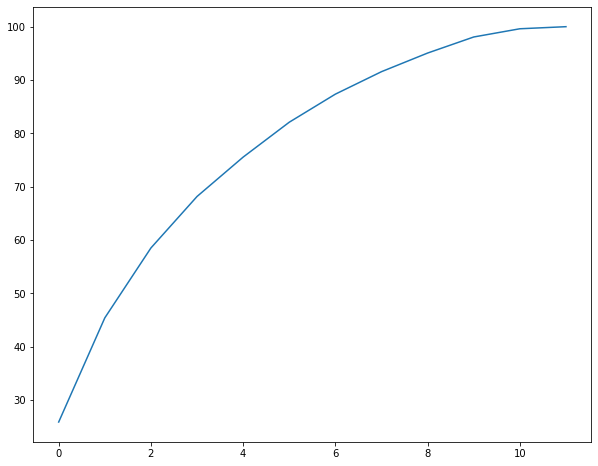

In [313]:
plt.plot(var1)

In [314]:
pca_ev=pca.components_
pca_ev

array([[ 0.46748155, -0.0383017 , -0.09469863,  0.11835797, -0.09163632,
         0.11010752, -0.34536468, -0.21934715, -0.12182498,  0.53324443,
         0.50187834, -0.13429038],
       [ 0.18189228,  0.39682502,  0.16164582,  0.38508057,  0.21167248,
         0.32190725,  0.19879049, -0.36139632,  0.30858349,  0.05071397,
        -0.10994128,  0.45452331],
       [ 0.26390251,  0.26939713, -0.2298681 , -0.45428592, -0.13094152,
        -0.48442324,  0.39200635,  0.06257948,  0.26664354,  0.1754796 ,
         0.1623096 ,  0.2468453 ],
       [-0.12915698,  0.05208923, -0.62894209,  0.24498601, -0.66302293,
         0.1906937 ,  0.01940034, -0.12098595,  0.09766564, -0.1193075 ,
        -0.10034888,  0.0140949 ],
       [-0.07597044,  0.53623697, -0.22305405, -0.0550237 ,  0.12770478,
         0.12500206, -0.13462912,  0.31339242, -0.64309734, -0.00661023,
         0.05359796,  0.29855188],
       [ 0.14643391, -0.14007227, -0.4740853 , -0.07819354,  0.45774263,
         0.38449309, -

In [315]:
pca_evl=pca.explained_variance_
pca_evl

array([3.1073128 , 2.3429881 , 1.57220141, 1.15782931, 0.88589857,
       0.78530833, 0.63119264, 0.50513565, 0.41910169, 0.36079312,
       0.18500439, 0.04728682])

In [316]:
pca=PCA(n_components=6)
pca.fit(x)
x1=pca.fit_transform(X)
x1

array([[ 0.35239539,  0.95363463, -0.38421239, -0.30667086, -1.43145557,
         0.87520953],
       [ 0.43228517, -0.65633532, -1.071162  , -1.45247806, -0.86368821,
        -1.87531006],
       [ 1.58460195,  0.10061931, -1.41724959, -0.57212122, -0.20114986,
         0.28389618],
       ...,
       [-0.77034346,  0.9146894 , -0.96764466, -0.74569235,  0.75851535,
         0.28847652],
       [-0.64227924, -1.37914346,  1.46286893,  1.02686219, -0.29980923,
         0.03149948],
       [ 0.06056205,  0.62534468, -0.56075462, -1.57415975, -1.28027207,
        -0.49852241]])

In [317]:
x1=np.round(x1,2)
x1

array([[ 0.35,  0.95, -0.38, -0.31, -1.43,  0.88],
       [ 0.43, -0.66, -1.07, -1.45, -0.86, -1.88],
       [ 1.58,  0.1 , -1.42, -0.57, -0.2 ,  0.28],
       ...,
       [-0.77,  0.91, -0.97, -0.75,  0.76,  0.29],
       [-0.64, -1.38,  1.46,  1.03, -0.3 ,  0.03],
       [ 0.06,  0.63, -0.56, -1.57, -1.28, -0.5 ]])

In [318]:
x_train,x_test,y_train,y_test=train_test_split(x1,y,test_size=0.25,random_state=121)

In [319]:
lr=LogisticRegression()
PCA_lrmodel=lr.fit(x_train,y_train)

In [320]:
Logiestic_PCA_pred=PCA_lrmodel.predict(x_test)
Logiestic_PCA_pred

array([1, 0, 0, ..., 1, 0, 0])

In [321]:
print(classification_report(y_test,Logiestic_PCA_pred))

              precision    recall  f1-score   support

           0       0.72      0.75      0.73     28454
           1       0.74      0.70      0.72     28338

    accuracy                           0.73     56792
   macro avg       0.73      0.73      0.73     56792
weighted avg       0.73      0.73      0.73     56792



In [322]:
acc_PCA_lr=accuracy_score(y_test,Logiestic_PCA_pred)*100
acc_PCA_lr=round(acc_PCA_lr,2)
acc_PCA_lr

72.75

In [323]:
knn=KNeighborsClassifier(n_neighbors=4)
PCA_knnmodel=knn.fit(x_train,y_train)

PCA_knn_pred=PCA_knnmodel.predict(x_test)
PCA_knn_pred

array([1, 0, 0, ..., 1, 0, 0])

In [324]:
print(classification_report(y_test,PCA_knn_pred))

              precision    recall  f1-score   support

           0       0.80      0.78      0.79     28454
           1       0.79      0.81      0.80     28338

    accuracy                           0.79     56792
   macro avg       0.79      0.79      0.79     56792
weighted avg       0.79      0.79      0.79     56792



In [325]:
acc_PCA_knn=accuracy_score(y_test,PCA_knn_pred)*100
acc_PCA_knn=round(acc_PCA_knn,2)
acc_PCA_knn

79.43

In [327]:
pca_RFmodel = RandomForestClassifier(n_estimators=150)
pca_RFmodel.fit(xtrain,ytrain)

RandomForestClassifier(n_estimators=150)

In [328]:
RF_PCApred=pca_RFmodel.predict(xtest)

In [329]:
print(classification_report(ytest,RF_PCApred))

              precision    recall  f1-score   support

           0       0.97      0.90      0.93     28442
           1       0.90      0.97      0.93     28350

    accuracy                           0.93     56792
   macro avg       0.93      0.93      0.93     56792
weighted avg       0.93      0.93      0.93     56792



In [330]:
acc_PCA_RF=accuracy_score(ytest,RF_PCApred)*100
acc_PCA_RF=round(acc_PCA_RF,2)
acc_PCA_RF

93.26

In [333]:
Accuracy_comp_df=pd.DataFrame({'Classification Model':['LOGISTIC REGRESSION','DECISION TREE',
                                                  'RANDOM FOREST','K-NEAREST NEIGHBOUR','LOGISTIC REGRESSION WITH PCA','K-NEAREST NEIGHBOUR WITH PCA','RANDOM FOREST WITH PCA'],
                          'Accuracy':[acc_lr,acc_dtc,acc_RF,acc_knn,acc_PCA_lr,acc_PCA_knn,acc_PCA_RF]})
Accuracy_comp_df

,Classification Model,Accuracy
0,LOGISTIC REGRESSION,73.96
1,DECISION TREE,89.00
2,RANDOM FOREST,93.23
3,K-NEAREST NEIGHBOUR,80.53
4,LOGISTIC REGRESSION WITH PCA,72.75
5,K-NEAREST NEIGHBOUR WITH PCA,79.43
6,RANDOM FOREST WITH PCA,93.26


# TIME SERIES

In [334]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tsa.stattools import adfuller
%matplotlib inline
from math import sqrt
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
from statsmodels.tsa.stattools import adfuller

In [340]:
ts_raindf=pd.read_csv("D:\\DATA SCIENCE\\Kaggle Projects\\11.AUSTRALIA RAINFALL PREDICTION\\weatherAUS.csv")

In [341]:
ts_raindf.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [342]:
ts_raindf.Date = pd.to_datetime(ts_raindf.Date)

In [343]:
ts_raindf=ts_raindf[["Date",'Rainfall']]

In [344]:
ts_raindf["Rainfall"]=ts_raindf.Rainfall.fillna(ts_raindf.Rainfall.mean())

In [345]:
ts_raindf = ts_raindf.set_index('Date')
ts_raindf.head()

,Rainfall
Date,
2008-12-01,0.6
2008-12-02,0.0
2008-12-03,0.0
2008-12-04,0.0
2008-12-05,1.0


In [346]:
ts_raindf.describe()

,Rainfall
count,145460.000000
mean,2.360918
std,8.382488
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,371.000000


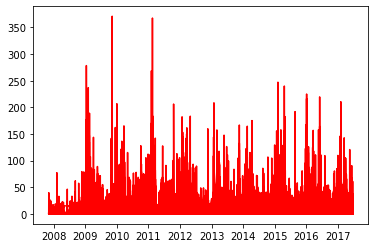

In [347]:
plt.plot(ts_raindf,"r")

Text(0.5, 1.0, 'Histogram of orginal data')

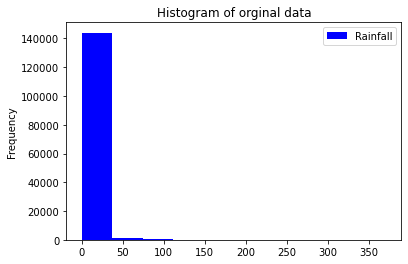

In [348]:
ts_raindf.plot(kind='hist',facecolor="blue")
plt.title("Histogram of orginal data")

<AxesSubplot:ylabel='Density'>

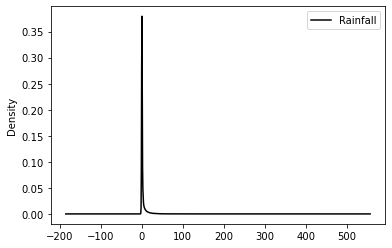

In [349]:
ts_raindf.plot(kind='kde',color="black")

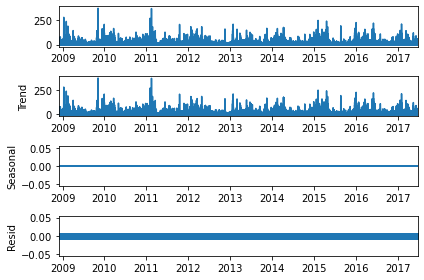

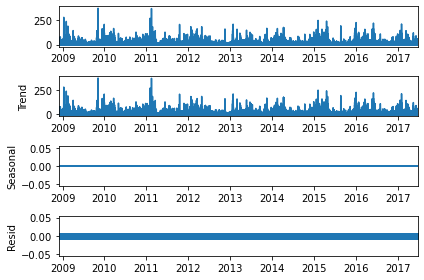

In [351]:
df_decomp_add=seasonal_decompose(ts_raindf,period=1,model="additive")
df_decomp_add.plot()

In [352]:
dfMA = ts_raindf.rolling(window=12).mean()

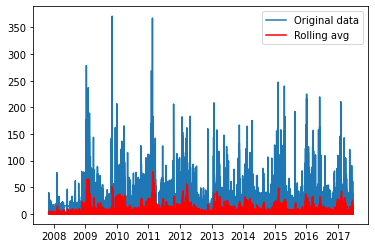

In [353]:
plt.plot(ts_raindf,label='Original data')
plt.plot(dfMA,color='red',label='Rolling avg')
plt.legend(loc='best')
plt.show()


In [354]:
df_ma_res = ts_raindf - dfMA
df_ma_res.head()

,Rainfall
Date,
2008-12-01,NaN
2008-12-02,NaN
2008-12-03,NaN
2008-12-04,NaN
2008-12-05,NaN


In [355]:
df_ma_res=df_ma_res.dropna()
df_ma_res.head()

,Rainfall
Date,
2008-12-12,1.750000
2008-12-13,13.900000
2008-12-14,1.600000
2008-12-15,-2.000000
2008-12-16,0.164175


Text(0.5, 1.0, 'Line plot of Residuals')

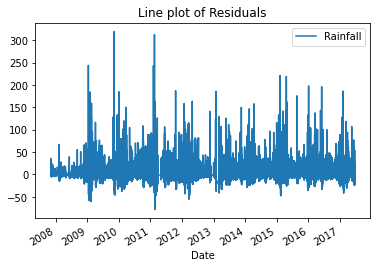

In [356]:
#Lineplot
df_ma_res.plot()
plt.title('Line plot of Residuals')

Text(0.5, 1.0, 'Histogram of residuals')

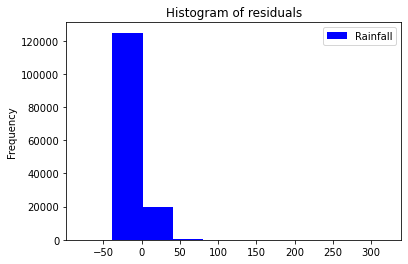

In [357]:
df_ma_res.plot(kind='hist',facecolor="blue")
plt.title("Histogram of residuals")

In [358]:
#squaring residuals/errors
df_ma_res_se=pow(df_ma_res,2)
print(df_ma_res_se.head())

#mean of squared errors
df_ma_res_mse=df_ma_res_se.sum()/len(df_ma_res_se)
print("mse: ",df_ma_res_mse)

df_ma_res_rmse=sqrt(df_ma_res_mse)
print("rmse: ",df_ma_res_rmse)

              Rainfall
Date                  
2008-12-12    3.062500
2008-12-13  193.210000
2008-12-14    2.560000
2008-12-15    4.000000
2008-12-16    0.026953
mse:  Rainfall    60.237625
dtype: float64
rmse:  7.761290156312154


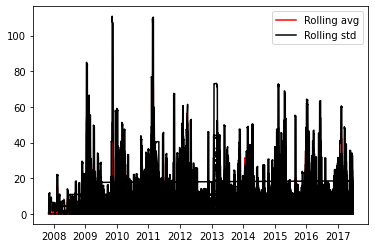

In [359]:
rolmean = ts_raindf.rolling(window=12).mean()
rolstd = ts_raindf.rolling(window=12).std()

plt.plot(rolmean,color='red',label='Rolling avg')
plt.plot(rolstd,color='black',label='Rolling std')
plt.legend(loc='best')
plt.show()

In [360]:
df_adf=adfuller(ts_raindf,autolag='AIC')

In [361]:
print('ADF Statistic: %f' % df_adf[0])
print('p-value: %f' % df_adf[1])
print('Critical Values:')
for key, value in df_adf[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -31.581079
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


##### p-value: 0 ie < 0.05, Null Hypothesis is rejected, so, Data is  stationary
H0 data is not stationary

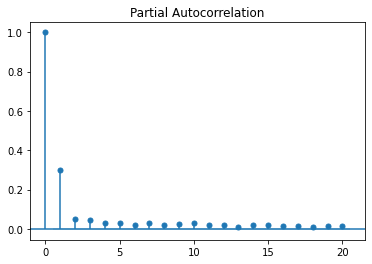

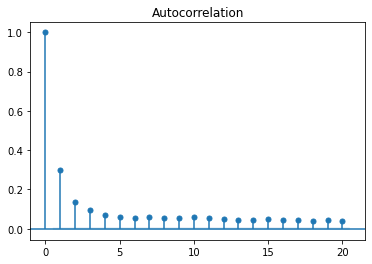

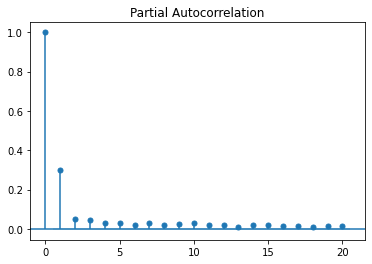

In [363]:
#Plotting acf & pacf for residuals
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
plot_acf(ts_raindf, lags=20) 
plot_pacf(ts_raindf, lags=20)

In [366]:
from pmdarima import auto_arima

In [367]:
df1_aa_mod=auto_arima(ts_raindf)
df1_aa_mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:               145460
Model:               SARIMAX(1, 1, 4)   Log Likelihood             -507978.296
Date:                Tue, 05 Oct 2021   AIC                        1015970.591
Time:                        21:22:26   BIC                        1016039.805
Sample:                             0   HQIC                       1015991.248
                             - 145460                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -6.386e-05      0.000     -0.264      0.792      -0.001       0.000
ar.L1          0.6388      0.019     33.394      0.000       0.601       0.676
ma.L1         -1.3646      0.019    -71.234      0.000      -1.402      -1.327
ma.L2          0.2975      0.014     21.291      0.000       0.270       0.325
ma.L3          0.0622      0.003     19.093      0.000       0.056       0.069
ma.L4          0.0130      0.002      5.264      0.000       0.008       0.018
sigma2        63.1508      0.036   1731.893      0.000      63.079      63.222
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):         172331326.06
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               0.51   Skew:                             9.03
Prob(H) (two-sided):                  0.00   Kurtosis:                       170.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [368]:
df1_aa_mod_res=df1_aa_mod.resid()
df1_aa_mod_res

array([ 0.60017681, -0.59980057, -0.22982957, ..., -0.46420383,
       -0.45705057, -0.45000568])

In [369]:
df1_aa_mod_res1=pd.DataFrame(df1_aa_mod_res,index=df1.index)
df1_aa_mod_res1

,0
0,0.600177
1,-0.599801
2,-0.229830
3,-0.162389
4,0.875092
...,...
145455,-0.478842
145456,-0.471467
145457,-0.464204
145458,-0.457051


<AxesSubplot:ylabel='Frequency'>

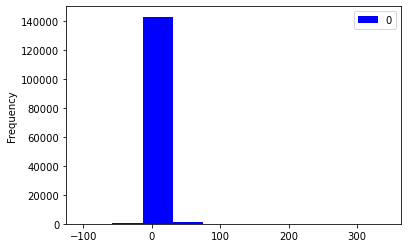

In [370]:
df1_aa_mod_res1.plot(kind='hist',facecolor="blue")

In [371]:
#squaring residuals/errors
df1_aa_mod_res1_se=pow(df1_aa_mod_res1,2)
df1_aa_mod_res1_se.head()

,0
0,0.360212
1,0.359761
2,0.052822
3,0.026370
4,0.765786


In [372]:
#mean of squared errors
df1_aa_mod_res1_mse=df1_aa_mod_res1_se.sum()/len(df1_aa_mod_res1_se)
df1_aa_mod_res1_mse

0    63.217842
dtype: float64

In [373]:
df1_aa_mod_res1_rmse=sqrt(df1_aa_mod_res1_mse)
df1_aa_mod_res1_rmse

7.950964865030919

Text(0.5, 1.0, 'Line plot of Residuals')

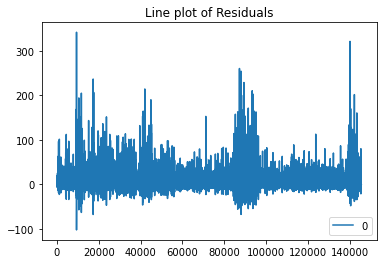

In [374]:
#Lineplot
df1_aa_mod_res1.plot()
plt.title('Line plot of Residuals')

Text(0.5, 1.0, 'Histogram of Residuals')

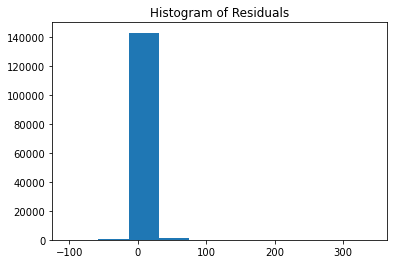

In [375]:
#Histogram of residuals
plt.hist(df1_aa_mod_res1)
plt.title('Histogram of Residuals')

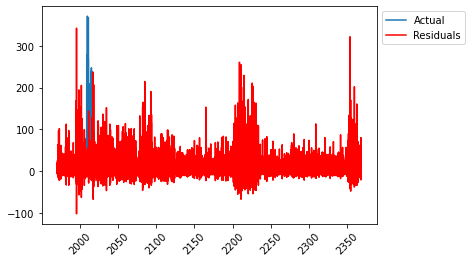

In [376]:
#Plot comparision Actual, Model Values & Residuals
plt.plot(ts_raindf)
plt.plot(df1_aa_mod_res1, 'r')
plt.legend(['Actual', 'Residuals'],
           bbox_to_anchor=(1, 1), loc=2)
plt.xticks(rotation=45)
plt.show()


In [384]:
ts_raindf.tail()

,Rainfall
Date,
2017-06-21,0.0
2017-06-22,0.0
2017-06-23,0.0
2017-06-24,0.0
2017-06-25,0.0


In [386]:
#Predict
Aus_Rainfall_pred = df1_aa_mod.predict(n_periods=12) 
Aus_Rainfall_pred = pd.DataFrame(Aus_Rainfall_pred, 
                             index=pd.date_range(start='2017-06-25', 
                                                 end='2018-06-25', freq='M'))


In [387]:
Aus_Rainfall_pred

,0
2017-06-30,0.443068
2017-07-31,0.557747
2017-08-31,0.597031
2017-09-30,0.616212
2017-10-31,0.628402
2017-11-30,0.636126
2017-12-31,0.640996
2018-01-31,0.644043
2018-02-28,0.645926
2018-03-31,0.647065


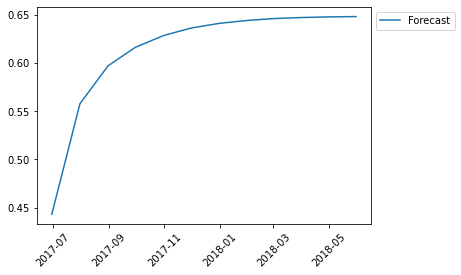

In [389]:
plt.plot(Aus_Rainfall_pred)
plt.legend(['Forecast'],
           bbox_to_anchor=(1, 1), loc=2)
plt.xticks(rotation=45)
plt.show()

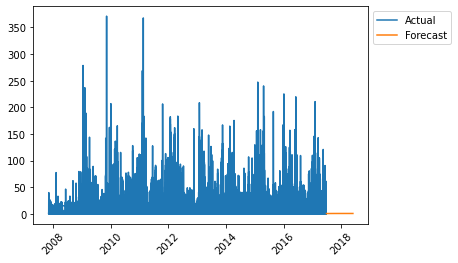

In [388]:
#Plot comparision Actual, Model Values & Forecast
plt.plot(ts_raindf)
plt.plot(Aus_Rainfall_pred)
plt.legend(['Actual', 'Forecast'],
           bbox_to_anchor=(1, 1), loc=2)
plt.xticks(rotation=45)
plt.show()